




























































































































#**– Introduction –**
#Vision Zero Vehicle Crash/Collision Report
* What is the goal of your project?
* What are you investigating 
* Why is it important?

**Vision Zero was first adopted by New York City in 2014.**


Sweden first developed this strategy in the 1990’s. Vision Zero has been eliminating traffic fatalities and severe injuries across Europe while increasing safe, healthy, equitable mobility for all. After years of proved successful implementation across Europe major cities accross the Unitied States have started successfully utilizing these strategies.



































































##**– Data sources –**

  * Data Provided by Police Department (NYPD) City of New York Open Data
    * https://data.cityofnewyork.us/Public-Safety/Motor-Vehicle-Collisions-Person/f55k-p6yu
    The Motor Vehicle Collisions person table contains details for people involved in the crash. Each row represents a person (driver,occupant,pedestrian,bicyclist,..) involved in a crash

    The police report (MV104-AN) is required to be filled out for collisions where someone is injured or killed,or where there is at least $1000 worth of damage

      * UPDATE:
        * April 19,2022
      * RECENT UPDATE: 
        * August 3,2022

* INITIAL IMPORT FILE: 
    * Date range:  2012-07-01 00:00:00  -  2022-07-30 00:00:00      
      * Rows:  4,757,334
      * Columns:  21
* AFTER UPDATE: 
    * Date range:  2012-07-01 00:00:00  -  2022-08-01 00:00:00
      * Rows:  4,759,121
      * Columns:  21

##**- DF totals -**

* AFTER CLEANING: 
  * Date range:  2018-01-01 00:00:00  -  2022-08-01 00:00:00
    * Rows:  4,288,654
    * Columns:  15

* CATEGORIES:   
 * Bicyclists:
   * 2012-update on file
       * Rows:  56,994
       * Columns:  23
   * 2018-update on file
       * Rows:  29,681 
       * Columns:  23
   * 2018
       * Rows:  6,052
       * Columns:  23
   * 2019
       * Rows:  
       * Columns:  
   * 2020
       * Rows:  
       * Columns:  
   * 2021
       * Rows: 
       * Columns:  
   * 2022-update on file
       * Rows:  
       * Columns:  
---


##**– Methodologies –**
* Python libraries
  *   pandas - Primary data structure library
  *   numpy - Useful for scientific computing
  *   matplotlib.pyplot - Useful for plotting and graphing
  *   seaborn - Advanced plotting and graphing,built upon the matplotlib 
* data cleaning
  *   Checking for duplicates,null values,missing or corrupt data
  *   Dropping rows with missing values
  *   Decriptives/Exploring
  * Grouping and looking at the values according top Gender and Age. 
  *   Narrowing the PERSON_TYPE to Bicycling
* transformations,etc.
  *   Attempting to correct/replace/coerrce the Age values
  *   Replacing missing values
  *   Dropping columns
  *   Creating New Date Columns
  *   Converting date and time columns to to their specified data types
  *   strftime() - datetime to string
* types of visualizations
  * plt
    * barh
    * plot.pie
  * sns
    * relplot
    * subplots
   * scatter plot
   * FacetGrid,barplot



> ***important notes:

>>  After querying when to change age from float to an integer considering this is police data:



>>>   "Working on a project to evaluate under-aged drinking (from a legal standpoint)? Then you should use the rounded down int value (eg if legal age is 16 and a person is 15.9,legally they are 15 and therefore under-aged drinking)" - https://stackoverflow.com/questions/67329095/when-should-you-convert-age-column-in-float-or-int



 >***FACTCHECK**
This is an analysis of  Bicycists involved in collisions and or crashes These incidencts are classified by date and time resulting in a Unique ID,Collision ID assigned by the NYPD (City of New Yorks Department of Motor Vehicles). 

 >Each year: list or show number of bicyclists are injured or killed,affected because of? Where they using safty equpment? FOR FUTURE ANALYSIS: *** fact check this
 Is Green Space and the Colaboration with CitiBike working? 
 How are the areas affected being addressed? Are they? Do the areas coincide with the planned expansions of CitiBike? 
 ecspecially in relation to the areas that citibike is expanding into. 
 (FUTURE CONSIDERATION: need to cross compare analysis first to other collision and crash data['COLLISION_ID'] to get geolocation data. Compare in relation to Vision Zeros expansion and future projections. Then compare that to the to citibike expansion data.)

 Grab contributing factors and do and analysis on those also


---





##**– Findings and conclusions –**

* What did you learn from the data? 
* Person Injury:
>>>Injured 22916
>>>Unspecified 6664
>>>Killed 101
  * The peak hours of incidents involving bicyclists are during the late after noon to early evening. These times correspond to high traffic times.
  * The warmer months are also showing that more accidents are happening between the months of May and October. 
    * June July and August holding the highest amounts of incidents.
  * Men are more involved in the reported incidents. 
  * Most victims of the incidents are fully concious and survive

* Was it what you expected?
* That this would be a long mystery of figuring out coding,ploting along with applyig statistical and analytical thinking? As far as the data. I have yet to be able to know if my expectations that the city greenzoning has had a direct affect on Crashes involving biclyists. 
* Has NYC Vision zero made an impact on the safety of NYC? Further analysis will be needed. 
* What kind of recommendations can be presented to NYC to improve the program?
Further analysis will be needed.
* What seems to be working or not working?
Further analysis will be needed.



#**Import libraries**

In [1]:
#
import pandas as pd#primary data structure library
import numpy as np#useful for many scientific computing in Python
import seaborn as sns#useful for plotting and graphing,built upon the matplotlib library.
from seaborn.rcmod import axes_style
import matplotlib as mpl
import matplotlib.pyplot as plt
import matplotlib.dates as mdates
%matplotlib inline 

In [2]:
#
from google.colab import drive
drive.mount('/content/drive')

Mounted at /content/drive


In [3]:
#
#title@Motor_Vehicle_Collisions_-_Crashes.csv
#Further consideration['COLLISION_ID']
#vmcpu=pd.read_csv('/content/Motor_Vehicle_Collisions_-_Crashes.csv')
#vmcpu=pd.read_csv('/content/drive/MyDrive/Capstone_python/csv_files/Motor_Vehicle_Collisions_Person_Update.csv')

#Exploring -Descriptives


In [4]:
#
#title@Motor_Vehicle_Collisions_Person_Update=vmcpu
#print('Rows,Columns:',vmcpu.shape)

In [5]:
#
#vmcpu.info()

In [6]:
#
#vmcpu.head()

In [7]:
#
#vmcpu.tail()

####Checking for null values


In [8]:
#
#title@Motor_Vehicle_Collisions_Person_Update=vmcpu
#display counts of missing values with a summary list
#vmcpu.isnull().sum()

In [9]:
#
#vmcpu.isnull().sum().sum()

In [10]:
#
#title@Motor_Vehicle_Collisions_Person_Update=vmcpu
#check missing values in different columns via heatmap?
#the column of['PED_LOCATION','PED_ACTION','CONTRIBUTING_FACTOR_1','CONTRIBUTING_FACTOR_2'] mostly null values - new fields? -not being implemented?
#sns.heatmap(vmcpu.isnull(),cbar=False) 

In [11]:
#
#vmcpu.dtypes

In [12]:
#
missing_values=['nan','-']
vmcpu=pd.read_csv('/content/drive/MyDrive/Capstone_python/csv_files/Motor_Vehicle_Collisions_Person_Update.csv',na_values=missing_values)

In [13]:
#
vmcpu.isnull().sum().sum()

33913783

##Unique 

In [14]:
#
#title@Motor_Vehicle_Collisions_Person_Update=vmcpu
print('Columns:\n',vmcpu.columns)

Columns:
 Index(['UNIQUE_ID', 'COLLISION_ID', 'CRASH_DATE', 'CRASH_TIME', 'PERSON_ID',
       'PERSON_TYPE', 'PERSON_INJURY', 'VEHICLE_ID', 'PERSON_AGE', 'EJECTION',
       'EMOTIONAL_STATUS', 'BODILY_INJURY', 'POSITION_IN_VEHICLE',
       'SAFETY_EQUIPMENT', 'PED_LOCATION', 'PED_ACTION', 'COMPLAINT',
       'PED_ROLE', 'CONTRIBUTING_FACTOR_1', 'CONTRIBUTING_FACTOR_2',
       'PERSON_SEX'],
      dtype='object')


In [15]:
#
print('Gender:\n',vmcpu['PERSON_SEX'].unique())

Gender:
 ['U' 'F' 'M' nan]


In [16]:
#
print('Person Type:\n',vmcpu['PERSON_TYPE'].unique())

Person Type:
 ['Occupant' 'Pedestrian' 'Bicyclist' 'Other Motorized']


In [17]:
#
print('Emotional Status:\n',vmcpu['EMOTIONAL_STATUS'].unique())

Emotional Status:
 [nan 'Does Not Apply' 'Conscious' 'Unknown' 'Shock' 'Incoherent'
 'Semiconscious' 'Apparent Death' 'Unconscious']


In [18]:
#
print('Bodily Injury:\n',vmcpu['BODILY_INJURY'].unique())

Bodily Injury:
 [nan 'Does Not Apply' 'Back' 'Shoulder - Upper Arm' 'Knee-Lower Leg Foot'
 'Head' 'Elbow-Lower-Arm-Hand' 'Chest' 'Neck' 'Unknown' 'Hip-Upper Leg'
 'Entire Body' 'Abdomen - Pelvis' 'Face' 'Eye']


In [19]:
#
print('Person Injury:\n',vmcpu['PERSON_INJURY'].unique())

Person Injury:
 ['Unspecified' 'Injured' 'Killed']


In [20]:
#
print('Saftey Equipment:\n',vmcpu['SAFETY_EQUIPMENT'].unique())

Saftey Equipment:
 [nan 'Lap Belt & Harness' 'Lap Belt' 'Unknown' 'None' 'Other'
 'Child Restraint Only' 'Helmet Only (In-Line Skater/Bicyclist)'
 'Helmet (Motorcycle Only)' 'Air Bag Deployed/Lap Belt/Harness'
 'Air Bag Deployed' 'Air Bag Deployed/Lap Belt'
 'Helmet/Other (In-Line Skater/Bicyclist)' 'Harness'
 'Air Bag Deployed/Child Restraint'
 'Stoppers Only (In-Line Skater/Bicyclist)'
 'Pads Only (In-Line Skater/Bicyclist)' 'Lap Belt/Harness']


In [21]:
#
vmcpu.COLLISION_ID.is_unique

False

In [22]:
#
#INDEX?
vmcpu.UNIQUE_ID.is_unique

True

##**DataFrame** - Checking for,dropping duplicates if needed

###**DataFrame** - BUFFER -Selecting or dropped columns/ rows/ changing data types

In [23]:
#
#titleBUFFER@Motor_Vehicle_Collisions_Person_Update=vmcpub
#drop duplicate data 
vmcpub=vmcpu.drop_duplicates()
vmcpub.shape==vmcpu.shape  
#vmcpu Rows,Columns: (4759121,21),no duplicate rows

True

In [24]:
#
vmcpub=pd.DataFrame(vmcpu)

In [25]:
#
print('Rows:,Columns:',vmcpub.shape)

Rows:,Columns: (4759121, 21)


In [26]:
#
print(vmcpub['PERSON_AGE'].value_counts())

0.0       545841
29.0       96061
30.0       96023
28.0       95903
27.0       95837
           ...  
2211.0         1
793.0          1
854.0          1
2222.0         1
1991.0         1
Name: PERSON_AGE, Length: 860, dtype: int64


In [27]:
#
vmcpub.PERSON_AGE.isnull().sum()

465768

###**Cleaning**

In [28]:
#
vmcpub.shape

(4759121, 21)

In [29]:
#
vmcpub.columns

Index(['UNIQUE_ID', 'COLLISION_ID', 'CRASH_DATE', 'CRASH_TIME', 'PERSON_ID',
       'PERSON_TYPE', 'PERSON_INJURY', 'VEHICLE_ID', 'PERSON_AGE', 'EJECTION',
       'EMOTIONAL_STATUS', 'BODILY_INJURY', 'POSITION_IN_VEHICLE',
       'SAFETY_EQUIPMENT', 'PED_LOCATION', 'PED_ACTION', 'COMPLAINT',
       'PED_ROLE', 'CONTRIBUTING_FACTOR_1', 'CONTRIBUTING_FACTOR_2',
       'PERSON_SEX'],
      dtype='object')

####ilocate  (find use for you )

In [30]:
#
#vmcpub.iloc[155:160,5:6]

In [31]:
#
#vmcpub.iloc[11:15]

####OMMITTING Renaming columns for visualizations

In [32]:
#
#For reference
vmcpub.columns

Index(['UNIQUE_ID', 'COLLISION_ID', 'CRASH_DATE', 'CRASH_TIME', 'PERSON_ID',
       'PERSON_TYPE', 'PERSON_INJURY', 'VEHICLE_ID', 'PERSON_AGE', 'EJECTION',
       'EMOTIONAL_STATUS', 'BODILY_INJURY', 'POSITION_IN_VEHICLE',
       'SAFETY_EQUIPMENT', 'PED_LOCATION', 'PED_ACTION', 'COMPLAINT',
       'PED_ROLE', 'CONTRIBUTING_FACTOR_1', 'CONTRIBUTING_FACTOR_2',
       'PERSON_SEX'],
      dtype='object')

####Dropping columns

In [33]:
#
drop_cols=['PED_LOCATION','PED_ACTION','CONTRIBUTING_FACTOR_1','CONTRIBUTING_FACTOR_2','PERSON_ID','VEHICLE_ID']
vmcpub.drop(drop_cols,inplace=True,axis=1)

In [34]:
#
vmcpub.shape

(4759121, 15)

In [35]:
#
vmcpub.head(2)

,UNIQUE_ID,COLLISION_ID,CRASH_DATE,CRASH_TIME,PERSON_TYPE,PERSON_INJURY,PERSON_AGE,EJECTION,EMOTIONAL_STATUS,BODILY_INJURY,POSITION_IN_VEHICLE,SAFETY_EQUIPMENT,COMPLAINT,PED_ROLE,PERSON_SEX
0,10249006,4229554,10/26/2019,9:43,Occupant,Unspecified,NaN,NaN,NaN,NaN,NaN,NaN,NaN,Registrant,U
1,10255054,4230587,10/25/2019,15:15,Occupant,Unspecified,33.0,Not Ejected,Does Not Apply,Does Not Apply,"Front passenger, if two or more persons, inclu...",Lap Belt & Harness,Does Not Apply,Passenger,F


In [36]:
#
print(vmcpub.columns)

Index(['UNIQUE_ID', 'COLLISION_ID', 'CRASH_DATE', 'CRASH_TIME', 'PERSON_TYPE',
       'PERSON_INJURY', 'PERSON_AGE', 'EJECTION', 'EMOTIONAL_STATUS',
       'BODILY_INJURY', 'POSITION_IN_VEHICLE', 'SAFETY_EQUIPMENT', 'COMPLAINT',
       'PED_ROLE', 'PERSON_SEX'],
      dtype='object')


#Categorized

#**DataFrame** -BICYCLIST Category 07/2012-2022-update on file

##**DataFrame** 07/2012-2022-update on file

In [37]:
#
#Motor_Vehicle_Collisions_BICYCLIST_Update=vmvbu
vmvbu=pd.DataFrame(vmcpub)

In [38]:
#
biclycle_a=vmvbu[(vmvbu['PERSON_TYPE']=='Occupant') | (vmvbu['PERSON_TYPE']=='Pedestrian') | (vmvbu['PERSON_TYPE']=='Other Motorized')].index
vmvbu.drop(biclycle_a,inplace=True)
   #WHY DOESNT THIS WORK???
      #biclycle_a=vmvbu[(vmvbu['PERSON_TYPE']=='^(?!Bicyclist$).*')].index

###Descriptives

In [39]:
#
print('Bicyclists Involved in CollisionS 2012-2022 info:\nRows,Columns:\n',vmvbu.shape)

Bicyclists Involved in CollisionS 2012-2022 info:
Rows,Columns:
 (56994, 15)


In [40]:
#
vmvbu.info()

<class 'pandas.core.frame.DataFrame'>
Int64Index: 56994 entries, 18 to 4759099
Data columns (total 15 columns):
 #   Column               Non-Null Count  Dtype  
---  ------               --------------  -----  
 0   UNIQUE_ID            56994 non-null  int64  
 1   COLLISION_ID         56994 non-null  int64  
 2   CRASH_DATE           56994 non-null  object 
 3   CRASH_TIME           56994 non-null  object 
 4   PERSON_TYPE          56994 non-null  object 
 5   PERSON_INJURY        56994 non-null  object 
 6   PERSON_AGE           56842 non-null  float64
 7   EJECTION             41912 non-null  object 
 8   EMOTIONAL_STATUS     41915 non-null  object 
 9   BODILY_INJURY        41915 non-null  object 
 10  POSITION_IN_VEHICLE  41914 non-null  object 
 11  SAFETY_EQUIPMENT     41668 non-null  object 
 12  COMPLAINT            41915 non-null  object 
 13  PED_ROLE             41917 non-null  object 
 14  PERSON_SEX           41915 non-null  object 
dtypes: float64(1), int64(2), object(1

In [41]:
#
vmvbu.head(2)

,UNIQUE_ID,COLLISION_ID,CRASH_DATE,CRASH_TIME,PERSON_TYPE,PERSON_INJURY,PERSON_AGE,EJECTION,EMOTIONAL_STATUS,BODILY_INJURY,POSITION_IN_VEHICLE,SAFETY_EQUIPMENT,COMPLAINT,PED_ROLE,PERSON_SEX
18,10254556,4230715,10/26/2019,8:50,Bicyclist,Injured,42.0,Not Ejected,Unknown,Knee-Lower Leg Foot,Driver,Unknown,None Visible,Driver,M
31,10250834,4230376,10/26/2019,19:40,Bicyclist,Injured,36.0,Not Ejected,Conscious,Back,Driver,None,Internal,Driver,M


In [42]:
#
vmvbu.tail(2)

,UNIQUE_ID,COLLISION_ID,CRASH_DATE,CRASH_TIME,PERSON_TYPE,PERSON_INJURY,PERSON_AGE,EJECTION,EMOTIONAL_STATUS,BODILY_INJURY,POSITION_IN_VEHICLE,SAFETY_EQUIPMENT,COMPLAINT,PED_ROLE,PERSON_SEX
4759051,12236882,4532393,05/29/2022,18:51,Bicyclist,Unspecified,36.0,Not Ejected,Does Not Apply,Does Not Apply,Driver,Unknown,Does Not Apply,Driver,F
4759099,12236218,4532289,05/29/2022,9:00,Bicyclist,Injured,38.0,Not Ejected,Conscious,Hip-Upper Leg,Driver,Helmet Only (In-Line Skater/Bicyclist),Complaint of Pain or Nausea,Driver,M


####**Renaming columns**

In [43]:
#
vmvbu=vmvbu.rename(columns={'CRASH_DATE':'DATE','CRASH_TIME':'TIME','PERSON_AGE':'AGE','PERSON_SEX':'GENDER'})

In [44]:
#
vmvbu.columns

Index(['UNIQUE_ID', 'COLLISION_ID', 'DATE', 'TIME', 'PERSON_TYPE',
       'PERSON_INJURY', 'AGE', 'EJECTION', 'EMOTIONAL_STATUS', 'BODILY_INJURY',
       'POSITION_IN_VEHICLE', 'SAFETY_EQUIPMENT', 'COMPLAINT', 'PED_ROLE',
       'GENDER'],
      dtype='object')

###Column uniques

In [45]:
#
print('Category of Person Type',vmvbu['PERSON_TYPE'].unique())

Category of Person Type ['Bicyclist']


In [46]:
#
print('Gender Categories',vmvbu['GENDER'].unique())

Gender Categories ['M' 'F' nan 'U']


In [47]:
#
print('Categorys of Person Injury',vmvbu['PERSON_INJURY'].unique())

Categorys of Person Injury ['Injured' 'Unspecified' 'Killed']


In [48]:
#
print('Categorys of Emotional Status',vmvbu['EMOTIONAL_STATUS'].unique())

Categorys of Emotional Status ['Unknown' 'Conscious' 'Does Not Apply' 'Shock' 'Incoherent' 'Unconscious'
 nan 'Semiconscious' 'Apparent Death']


###Creating Index 

In [49]:
#
#.index  Future analysis... ID#s shared accross all three databases.)
vmvbu.set_index(['UNIQUE_ID'])


,COLLISION_ID,DATE,TIME,PERSON_TYPE,PERSON_INJURY,AGE,EJECTION,EMOTIONAL_STATUS,BODILY_INJURY,POSITION_IN_VEHICLE,SAFETY_EQUIPMENT,COMPLAINT,PED_ROLE,GENDER
UNIQUE_ID,,,,,,,,,,,,,,
10254556,4230715,10/26/2019,8:50,Bicyclist,Injured,42.0,Not Ejected,Unknown,Knee-Lower Leg Foot,Driver,Unknown,None Visible,Driver,M
10250834,4230376,10/26/2019,19:40,Bicyclist,Injured,36.0,Not Ejected,Conscious,Back,Driver,None,Internal,Driver,M
10251056,4230439,10/26/2019,0:05,Bicyclist,Injured,35.0,Ejected,Conscious,Elbow-Lower-Arm-Hand,Driver,None,Minor Bleeding,Driver,M
10249843,4230242,10/26/2019,6:54,Bicyclist,Injured,47.0,Not Ejected,Conscious,Back,Driver,Helmet Only (In-Line Skater/Bicyclist),None Visible,Driver,M
10254980,4230579,10/25/2019,22:24,Bicyclist,Injured,34.0,Ejected,Conscious,Back,Driver,Helmet Only (In-Line Skater/Bicyclist),Complaint of Pain or Nausea,Driver,M
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
12235868,4532222,05/29/2022,0:00,Bicyclist,Injured,50.0,Not Ejected,Conscious,Shoulder - Upper Arm,Driver,Helmet Only (In-Line Skater/Bicyclist),Complaint of Pain or Nausea,Driver,F
12235871,4532244,05/29/2022,10:00,Bicyclist,Injured,21.0,Not Ejected,Conscious,Hip-Upper Leg,Driver,Helmet Only (In-Line Skater/Bicyclist),Complaint of Pain or Nausea,Driver,F
12236707,4532395,05/29/2022,3:00,Bicyclist,Injured,20.0,Not Ejected,Conscious,Head,Riding/Hanging on Outside,None,Minor Bleeding,Driver,M


###Converting the date and time columns to to their specified data types

In [50]:
#
vmvbu['DATE_TIME']=(vmvbu['DATE'].map(str)+'-'+vmvbu['TIME'])
vmvbu['DATE_TIME']=pd.to_datetime(vmvbu.DATE_TIME)

In [51]:
#
#For easier QUERY
#Converting the date column to its specified data type
vmvbu['DATE']=pd.to_datetime(vmvbu.DATE)
#Creating three new columns for easy querying

vmvbu['YEAR']=vmvbu.DATE.dt.year
vmvbu['MONTH']=vmvbu.DATE.dt.month
vmvbu['DAY']=vmvbu.DATE.dt.day
#Creating 4 new columns for easy querying  ???? my creation... to plot maps..first time
vmvbu['YEAR_MONTH']=vmvbu['DATE'].map(lambda dt: dt.strftime('%Y-%m'))
vmvbu['MONTH_YEAR']=vmvbu['DATE'].map(lambda dt: dt.strftime('%m-%Y'))
vmvbu['YMD_HMS']=vmvbu['DATE_TIME'].map(lambda dt: dt.strftime('%Y-%m-%d %H:%M:%S'))


In [52]:
#
#check min max DATEs
min_date=min(vmvbu['DATE'])
max_date=max(vmvbu['DATE'])
print('Date range: ',min_date,'-',max_date)

Date range:  2012-07-01 00:00:00 - 2022-08-01 00:00:00


In [53]:
#
vmvbu.head(3)

,UNIQUE_ID,COLLISION_ID,DATE,TIME,PERSON_TYPE,PERSON_INJURY,AGE,EJECTION,EMOTIONAL_STATUS,BODILY_INJURY,...,COMPLAINT,PED_ROLE,GENDER,DATE_TIME,YEAR,MONTH,DAY,YEAR_MONTH,MONTH_YEAR,YMD_HMS
18,10254556,4230715,2019-10-26,8:50,Bicyclist,Injured,42.0,Not Ejected,Unknown,Knee-Lower Leg Foot,...,None Visible,Driver,M,2019-10-26 08:50:00,2019,10,26,2019-10,10-2019,2019-10-26 08:50:00
31,10250834,4230376,2019-10-26,19:40,Bicyclist,Injured,36.0,Not Ejected,Conscious,Back,...,Internal,Driver,M,2019-10-26 19:40:00,2019,10,26,2019-10,10-2019,2019-10-26 19:40:00
69,10251056,4230439,2019-10-26,0:05,Bicyclist,Injured,35.0,Ejected,Conscious,Elbow-Lower-Arm-Hand,...,Minor Bleeding,Driver,M,2019-10-26 00:05:00,2019,10,26,2019-10,10-2019,2019-10-26 00:05:00


In [54]:
#
vmvbu.dtypes

UNIQUE_ID                       int64
COLLISION_ID                    int64
DATE                   datetime64[ns]
TIME                           object
PERSON_TYPE                    object
PERSON_INJURY                  object
AGE                           float64
EJECTION                       object
EMOTIONAL_STATUS               object
BODILY_INJURY                  object
POSITION_IN_VEHICLE            object
SAFETY_EQUIPMENT               object
COMPLAINT                      object
PED_ROLE                       object
GENDER                         object
DATE_TIME              datetime64[ns]
YEAR                            int64
MONTH                           int64
DAY                             int64
YEAR_MONTH                     object
MONTH_YEAR                     object
YMD_HMS                        object
dtype: object

####Date Time columns created ???

In [55]:
#
vmvbu.shape

(56994, 22)

####Coercing Age column ??? 

In [56]:
#
print(vmvbu['AGE'].value_counts())

 25.0      1970
 26.0      1951
 28.0      1879
 24.0      1875
 27.0      1872
           ... 
 3047.0       1
 817.0        1
 1027.0       1
 1047.0       1
-962.0        1
Name: AGE, Length: 133, dtype: int64


In [57]:
#
vmvbu.AGE.isnull().sum()

152

In [58]:
#
print(vmvbu['AGE'].value_counts().nunique())

88


In [59]:
#
vmvbu.AGE=vmvbu.AGE.map(lambda x: np.nan if x <0 or x >100 else x)

In [60]:
#
vmvbu.dropna(subset=['AGE'],inplace=True)


In [61]:
#
print(vmvbu['AGE'].value_counts().nunique())

87


In [62]:
#
vmvbu.AGE.isnull().sum()

0

In [63]:
#
vmvbu['AGE']=vmvbu['AGE'].astype(int)

In [64]:
#
vmvbu.dtypes
#.Age=vmcpub.Age.map(lambda x: np.nan if x <0 or x >100 else x)

UNIQUE_ID                       int64
COLLISION_ID                    int64
DATE                   datetime64[ns]
TIME                           object
PERSON_TYPE                    object
PERSON_INJURY                  object
AGE                             int64
EJECTION                       object
EMOTIONAL_STATUS               object
BODILY_INJURY                  object
POSITION_IN_VEHICLE            object
SAFETY_EQUIPMENT               object
COMPLAINT                      object
PED_ROLE                       object
GENDER                         object
DATE_TIME              datetime64[ns]
YEAR                            int64
MONTH                           int64
DAY                             int64
YEAR_MONTH                     object
MONTH_YEAR                     object
YMD_HMS                        object
dtype: object

#Wrangling Sorting and Visualizations

####sort_values

In [65]:
#
vmvbu.sort_values(['DATE','TIME'],ascending=True,inplace=False).head(2)

,UNIQUE_ID,COLLISION_ID,DATE,TIME,PERSON_TYPE,PERSON_INJURY,AGE,EJECTION,EMOTIONAL_STATUS,BODILY_INJURY,...,COMPLAINT,PED_ROLE,GENDER,DATE_TIME,YEAR,MONTH,DAY,YEAR_MONTH,MONTH_YEAR,YMD_HMS
600575,1885858,193861,2012-07-01,12:15,Bicyclist,Injured,21,NaN,NaN,NaN,...,NaN,NaN,NaN,2012-07-01 12:15:00,2012,7,1,2012-07,07-2012,2012-07-01 12:15:00
2738833,1272222,9409,2012-07-01,14:14,Bicyclist,Injured,28,NaN,NaN,NaN,...,NaN,NaN,NaN,2012-07-01 14:14:00,2012,7,1,2012-07,07-2012,2012-07-01 14:14:00


##**Visualizations** 07/2012-2022-update on file


Vision Zero Bicycle Incidencts 07/2012 - 07/2022

Person Injury: 
* Injured        22916
* Unspecified     6664
* Killed           101

In [66]:
#
#Total counts of Persons Injured
print('Person Injury: \n',vmvbu['PERSON_INJURY'].value_counts())

Person Injury: 
 Injured        47292
Unspecified     9309
Killed           198
Name: PERSON_INJURY, dtype: int64


In [67]:
#
#Total counts by Emotional Status of Persons Injured
print('Persons Role: \n',vmvbu['PED_ROLE'].value_counts())

Persons Role: 
 Driver       40914
Passenger      810
Name: PED_ROLE, dtype: int64


In [68]:
#
#Total counts by Gender of Persons Injured
print('Gender: \n',vmvbu['GENDER'].value_counts())

Gender: 
 M    36025
F     5611
U       88
Name: GENDER, dtype: int64


In [69]:
#
vmvbu.head()

,UNIQUE_ID,COLLISION_ID,DATE,TIME,PERSON_TYPE,PERSON_INJURY,AGE,EJECTION,EMOTIONAL_STATUS,BODILY_INJURY,...,COMPLAINT,PED_ROLE,GENDER,DATE_TIME,YEAR,MONTH,DAY,YEAR_MONTH,MONTH_YEAR,YMD_HMS
18,10254556,4230715,2019-10-26,8:50,Bicyclist,Injured,42,Not Ejected,Unknown,Knee-Lower Leg Foot,...,None Visible,Driver,M,2019-10-26 08:50:00,2019,10,26,2019-10,10-2019,2019-10-26 08:50:00
31,10250834,4230376,2019-10-26,19:40,Bicyclist,Injured,36,Not Ejected,Conscious,Back,...,Internal,Driver,M,2019-10-26 19:40:00,2019,10,26,2019-10,10-2019,2019-10-26 19:40:00
69,10251056,4230439,2019-10-26,0:05,Bicyclist,Injured,35,Ejected,Conscious,Elbow-Lower-Arm-Hand,...,Minor Bleeding,Driver,M,2019-10-26 00:05:00,2019,10,26,2019-10,10-2019,2019-10-26 00:05:00
181,10249843,4230242,2019-10-26,6:54,Bicyclist,Injured,47,Not Ejected,Conscious,Back,...,None Visible,Driver,M,2019-10-26 06:54:00,2019,10,26,2019-10,10-2019,2019-10-26 06:54:00
499,10254980,4230579,2019-10-25,22:24,Bicyclist,Injured,34,Ejected,Conscious,Back,...,Complaint of Pain or Nausea,Driver,M,2019-10-25 22:24:00,2019,10,25,2019-10,10-2019,2019-10-25 22:24:00


In [70]:
#
print(vmvbu['BODILY_INJURY'].unique())

['Knee-Lower Leg Foot' 'Back' 'Elbow-Lower-Arm-Hand' 'Hip-Upper Leg'
 'Neck' 'Does Not Apply' 'Shoulder - Upper Arm' 'Entire Body' 'Head'
 'Face' 'Chest' 'Unknown' 'Eye' nan 'Abdomen - Pelvis']


In [71]:
#
print(vmvbu['SAFETY_EQUIPMENT'].unique())

['Unknown' 'None' 'Helmet Only (In-Line Skater/Bicyclist)'
 'Helmet/Other (In-Line Skater/Bicyclist)' 'Other' 'Lap Belt & Harness'
 'Helmet (Motorcycle Only)' nan 'Lap Belt'
 'Stoppers Only (In-Line Skater/Bicyclist)' 'Harness'
 'Air Bag Deployed/Lap Belt' 'Pads Only (In-Line Skater/Bicyclist)'
 'Child Restraint Only' 'Air Bag Deployed/Child Restraint']


In [72]:
#
#vmvbu.set_index('Unique ID',inplace=True)
vmvbu.sort_values(['DATE','TIME'],ascending=True,inplace=False).head(2)

,UNIQUE_ID,COLLISION_ID,DATE,TIME,PERSON_TYPE,PERSON_INJURY,AGE,EJECTION,EMOTIONAL_STATUS,BODILY_INJURY,...,COMPLAINT,PED_ROLE,GENDER,DATE_TIME,YEAR,MONTH,DAY,YEAR_MONTH,MONTH_YEAR,YMD_HMS
600575,1885858,193861,2012-07-01,12:15,Bicyclist,Injured,21,NaN,NaN,NaN,...,NaN,NaN,NaN,2012-07-01 12:15:00,2012,7,1,2012-07,07-2012,2012-07-01 12:15:00
2738833,1272222,9409,2012-07-01,14:14,Bicyclist,Injured,28,NaN,NaN,NaN,...,NaN,NaN,NaN,2012-07-01 14:14:00,2012,7,1,2012-07,07-2012,2012-07-01 14:14:00


(array([ 0,  1,  2,  3,  4,  5,  6,  7,  8,  9, 10, 11, 12, 13, 14, 15, 16,
        17, 18, 19, 20]), <a list of 21 Text major ticklabel objects>)

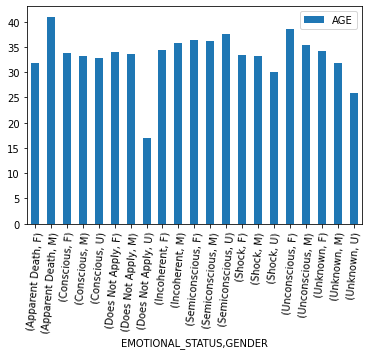

In [73]:
#
#ID=vmvbu['GENDER']
df1=pd.DataFrame(vmvbu.groupby(['EMOTIONAL_STATUS','GENDER'])['AGE'].mean())
df1.plot.bar()

plt.xticks(rotation=85)

In [74]:
#


Text(0, 0.5, 'Bicycling Incidents')

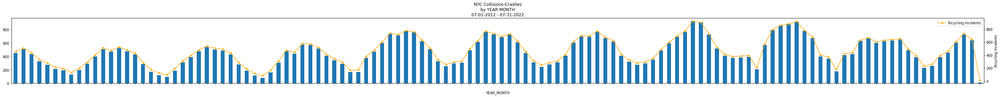

In [75]:
#
grouped_vmvbu=vmvbu.groupby('YEAR_MONTH').size().to_frame("Bicycling Incidents").reset_index()
plt.rcParams["figure.figsize"] = [40, 4]
plt.rcParams["figure.autolayout"] = True
ax = grouped_vmvbu.plot.bar(x='YEAR_MONTH',y='Bicycling Incidents',title='NYC Collisions-Crashes\nby YEAR MONTH\n07-01-2012 - 07-31-2022', legend=False)
grouped_vmvbu.plot(y='Bicycling Incidents', marker='*', color='orange', ax=ax, use_index=False,secondary_y=True, mark_right=False)

ax.set_xticklabels('                    ', rotation=15)
ax.right_ax.set_ylabel('Bicycling Incidents')
#plt.legend(bbox_to_anchor=(1.05,1),loc='upper left',borderaxespad=0)




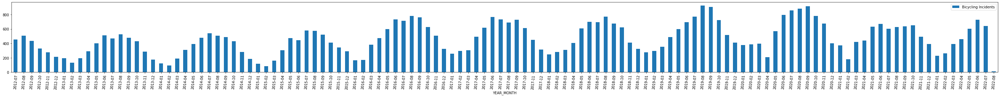

In [76]:
#
#,figsize=(4,50)
#representation of the month grouped by year with strfmt
grouped_vmvbu=vmvbu.groupby('YEAR_MONTH').size().to_frame("Bicycling Incidents").reset_index()
grouped_vmvbu.plot.bar(x='YEAR_MONTH',y='Bicycling Incidents',figsize=(40,4))
plt.xticks(rotation=85)
plt.show()

In [77]:
#
pd. set_option('display.max_rows', None)
pd. set_option('display.max_columns', None)
pd. set_option('display.width', None)
pd. set_option('display.max_colwidth', None)


In [78]:
#
print(vmvbu.groupby('YEAR_MONTH').size())

YEAR_MONTH
2012-07    454
2012-08    509
2012-09    435
2012-10    330
2012-11    277
2012-12    212
2013-01    192
2013-02    131
2013-03    196
2013-04    290
2013-05    402
2013-06    511
2013-07    470
2013-08    525
2013-09    479
2013-10    431
2013-11    284
2013-12    175
2014-01    121
2014-02     95
2014-03    190
2014-04    311
2014-05    392
2014-06    476
2014-07    541
2014-08    505
2014-09    490
2014-10    431
2014-11    282
2014-12    186
2015-01    116
2015-02     82
2015-03    162
2015-04    306
2015-05    475
2015-06    442
2015-07    577
2015-08    572
2015-09    519
2015-10    410
2015-11    343
2015-12    292
2016-01    166
2016-02    169
2016-03    381
2016-04    474
2016-05    599
2016-06    735
2016-07    715
2016-08    779
2016-09    761
2016-10    628
2016-11    506
2016-12    326
2017-01    256
2017-02    295
2017-03    306
2017-04    494
2017-05    618
2017-06    767
2017-07    733
2017-08    688
2017-09    726
2017-10    613
2017-11    451
2017-12    313

In [79]:
#
print(vmvbu.groupby('MONTH_YEAR').size())

MONTH_YEAR
01-2013    192
01-2014    121
01-2015    116
01-2016    166
01-2017    256
01-2018    245
01-2019    278
01-2020    377
01-2021    371
01-2022    228
02-2013    131
02-2014     95
02-2015     82
02-2016    169
02-2017    295
02-2018    283
02-2019    295
02-2020    385
02-2021    178
02-2022    261
03-2013    196
03-2014    190
03-2015    162
03-2016    381
03-2017    306
03-2018    311
03-2019    352
03-2020    395
03-2021    420
03-2022    392
04-2013    290
04-2014    311
04-2015    306
04-2016    474
04-2017    494
04-2018    408
04-2019    486
04-2020    207
04-2021    438
04-2022    458
05-2013    402
05-2014    392
05-2015    475
05-2016    599
05-2017    618
05-2018    608
05-2019    598
05-2020    571
05-2021    631
05-2022    604
06-2013    511
06-2014    476
06-2015    442
06-2016    735
06-2017    767
06-2018    701
06-2019    692
06-2020    793
06-2021    668
06-2022    730
07-2012    454
07-2013    470
07-2014    541
07-2015    577
07-2016    715
07-2017    733

#1

Text(0, 0.5, '')

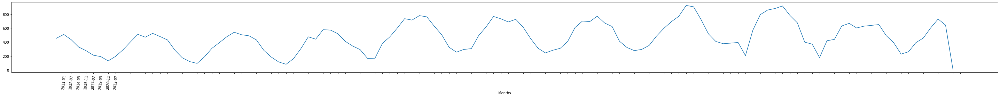

In [80]:
#plt.figure(figsize=(6,4))

vmvbu.YEAR_MONTH.value_counts().sort_index().plot(kind='line')
plt.xticks(range(1,123,1),rotation=85)
plt.xlabel('Months')
plt.ylabel('')

Text(0, 0.5, '')

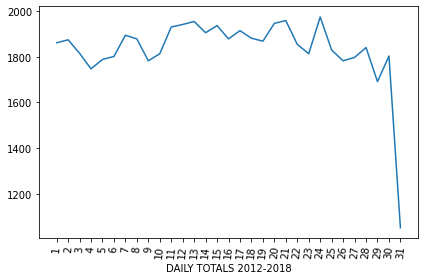

In [81]:
#
plt.figure(figsize=(6,4))
vmvbu.DAY.value_counts().sort_index().plot(kind='line')
plt.xticks(range(1,32,1),[str(x)+'' for x in range(1,32,1)],rotation=85)
plt.xlabel('DAILY TOTALS 2012-2018')
plt.ylabel('')
#trying to see if there is any correlation to days/time of month

#2

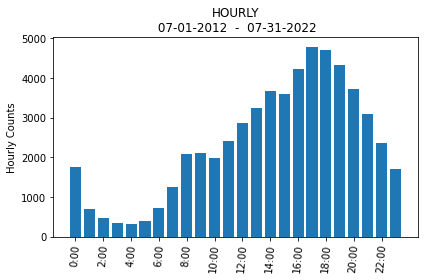

In [82]:
#
#'HOURLY\nNYC - Bicyclists Collisions-Crashes\n 07-01-2012  -  07-31-2022'
#making the time an integer that can be sorted. 
plt.figure(figsize=(6,4))
hourly2012_22=vmvbu['TIME'].str.split(':').str[0].astype('int').value_counts().sort_index()
plt.bar(hourly2012_22.index,hourly2012_22.values)
plt.xticks(range(0,24,2),[str(x)+":00" for x in range(0,24,2)],rotation=85)
plt.xlabel('')
plt.ylabel('Hourly Counts')
plt.title('HOURLY\n 07-01-2012  -  07-31-2022')
plt.show()


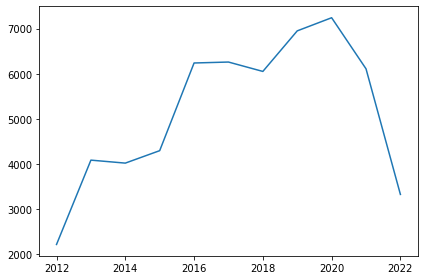

In [83]:
#
plt.figure(figsize=(6,4))
vmvbu.YEAR.value_counts().sort_index().plot()

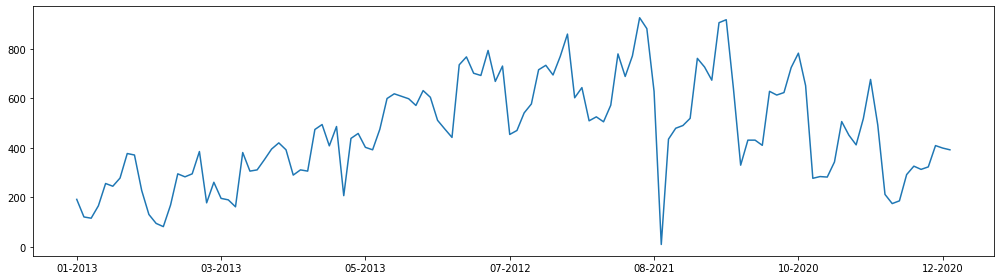

In [84]:
#
plt.figure(figsize=(14,4))
vmvbu.MONTH_YEAR.value_counts().sort_index().plot()

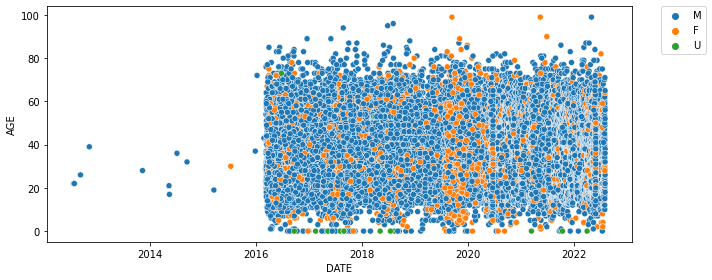

In [85]:
#
plt.figure(figsize=(10,4))
sns.scatterplot(data=vmvbu,x='DATE',y='AGE',hue='GENDER')
plt.legend(bbox_to_anchor=(1.05,1),loc='upper left',borderaxespad=0)


In [86]:
#
vmvbu.groupby(['GENDER','PERSON_INJURY'])['AGE'].median().sort_values(ascending=True)

GENDER  PERSON_INJURY
U       Unspecified      15.0
M       Injured          30.0
U       Injured          30.0
F       Killed           30.5
        Injured          31.0
        Unspecified      31.0
M       Unspecified      31.0
        Killed           41.0
Name: AGE, dtype: float64

In [87]:
#
vmvbu.groupby(['GENDER','PERSON_INJURY'])['AGE'].mean().sort_values(ascending=True)

GENDER  PERSON_INJURY
U       Unspecified      17.162162
        Injured          32.411765
M       Injured          33.274463
        Unspecified      33.492953
F       Injured          33.794098
        Unspecified      33.952703
        Killed           37.545455
M       Killed           42.882353
Name: AGE, dtype: float64

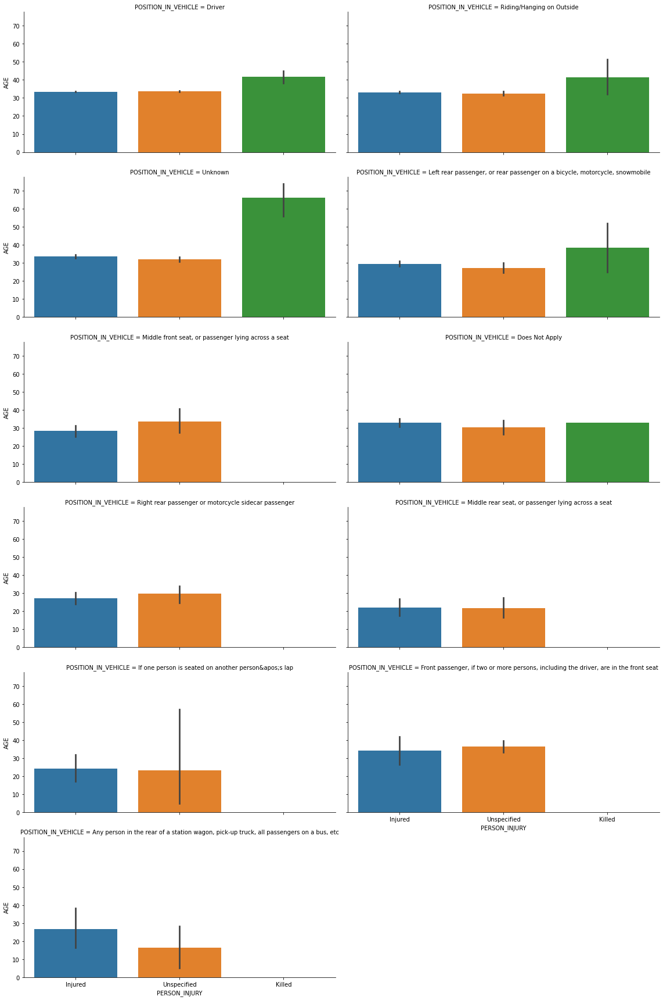

In [88]:
#
vzvbi=sns.FacetGrid(data=vmvbu,col='POSITION_IN_VEHICLE',hue='PERSON_INJURY',height=4,aspect=2,col_wrap=2)
vzvbi.map(sns.barplot,'PERSON_INJURY','AGE',order=['Injured','Unspecified','Killed'])
#plt.title("Bicyclists Bodily InjuriesY\nNYC Collisions-Crashes\n2018")

In [89]:
#
#vmvbu.plot.bar('DATE','AGE')

###2

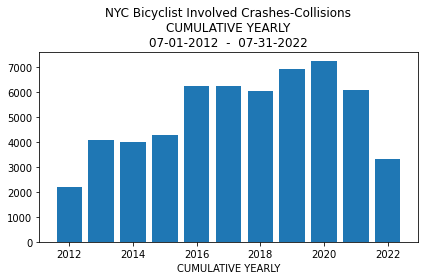

In [90]:
#
plt.figure(figsize=(6,4))
yearly2012_22=vmvbu['DATE'].dt.year.value_counts().sort_index()
plt.bar(yearly2012_22.index,yearly2012_22.values)
plt.xlabel('CUMULATIVE YEARLY')
plt.title('NYC Bicyclist Involved Crashes-Collisions\nCUMULATIVE YEARLY\n07-01-2012  -  07-31-2022')
#plt.style.use(style='bmh')
plt.show()

In [91]:
#
print('DATE by Year total counts\n',vmvbu['DATE'].dt.year.value_counts().sort_index())

DATE by Year total counts
 2012    2217
2013    4086
2014    4020
2015    4296
2016    6239
2017    6260
2018    6052
2019    6951
2020    7242
2021    6110
2022    3326
Name: DATE, dtype: int64


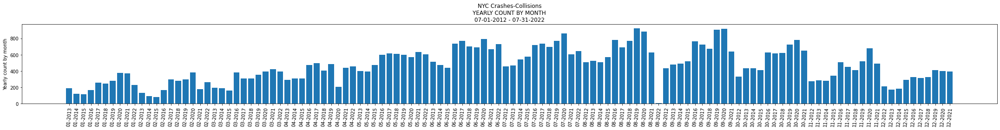

In [92]:
#

monthlyyr2012_22=vmvbu['MONTH_YEAR'].value_counts().sort_index()
plt.figure(figsize=(30,4))
plt.bar(monthlyyr2012_22.index,monthlyyr2012_22.values)
plt.xticks(range(0,122,1))
plt.xlabel('')
plt.ylabel('Yearly count by month')
plt.title('NYC Crashes-Collisions\nYEARLY COUNT BY MONTH\n07-01-2012 - 07-31-2022')
plt.xticks(rotation=85)
plt.show()

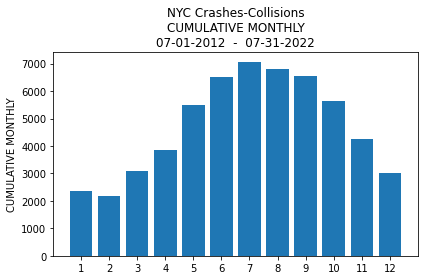

In [93]:
#
plt.figure(figsize=(6,4))
monthly2012_22=vmvbu['DATE'].dt.month.value_counts().sort_index()
plt.bar(monthly2012_22.index,monthly2012_22.values)
plt.xticks(range(1,13))
plt.xlabel('')
plt.ylabel('CUMULATIVE MONTHLY')
plt.title('NYC Crashes-Collisions\nCUMULATIVE MONTHLY\n07-01-2012  -  07-31-2022')
plt.show()

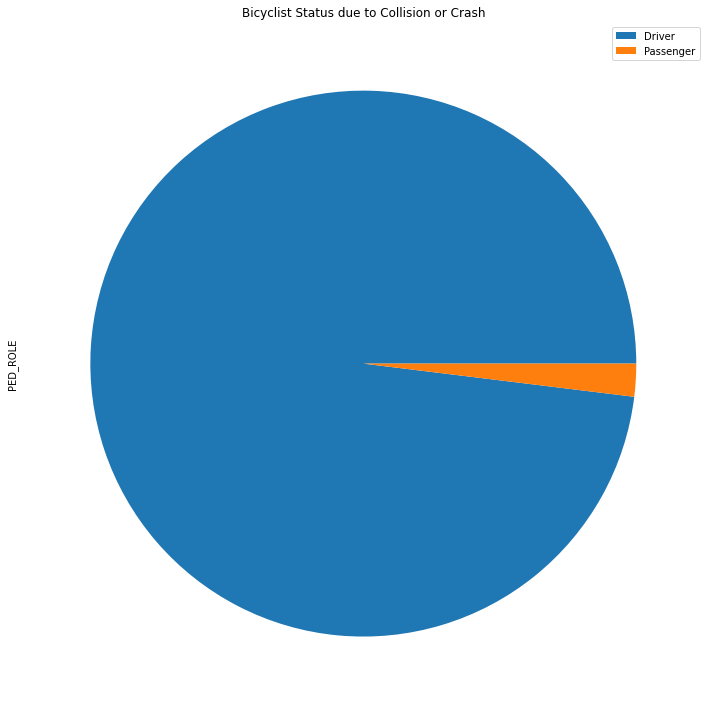

In [94]:
#
vmvbu['PED_ROLE'].value_counts().plot.pie(figsize=(10,10),legend=True,labeldistance=None,title='Bicyclist Status due to Collision or Crash')

Text(0.5, 0.98, 'NYC Collisions-Crashes\nDRIVER PASSENGER - Collision ID\n07-01-2012  -  07-31-2022')

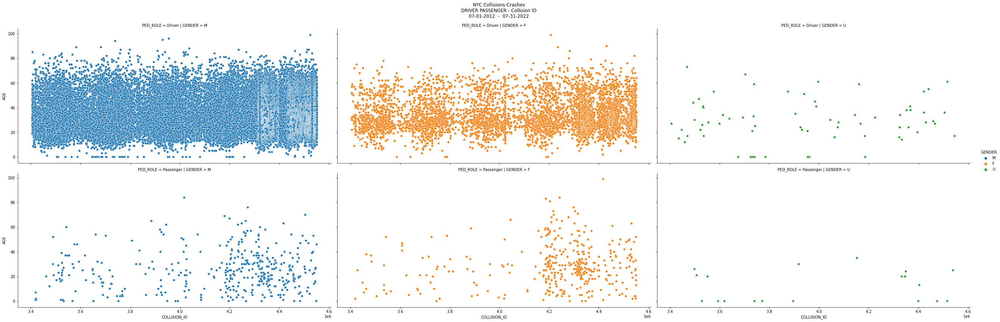

In [95]:
#
gpr=sns.relplot(data=vmvbu,x='COLLISION_ID',y='AGE',col='GENDER',row='PED_ROLE',hue='GENDER',kind='scatter',legend='auto',height=6,aspect=2)
#rp is a FacetGrid; 
#relplot is a nice organized way to use it
gpr.fig.subplots_adjust(top=0.9)#adjust the Figure in rp
gpr.fig.suptitle('NYC Collisions-Crashes\nDRIVER PASSENGER - Collision ID\n07-01-2012  -  07-31-2022')

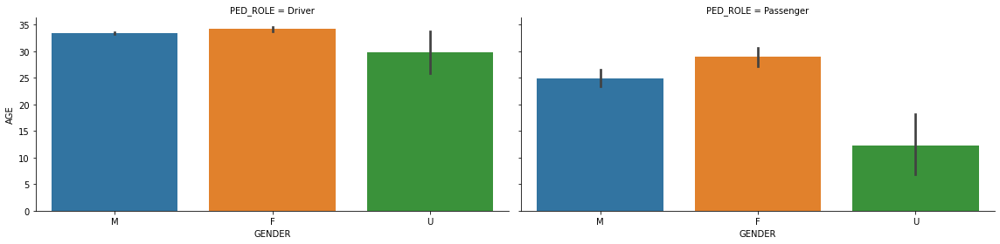

In [96]:
#
vzvbi=sns.FacetGrid(data=vmvbu,col='PED_ROLE',hue='GENDER',height=4,aspect=2,col_wrap=2)
vzvbi.map(sns.barplot,'GENDER','AGE',order=['M','F','U'])
#plt.title("Bicyclists Bodily InjuriesY\nNYC Collisions-Crashes\n2018")

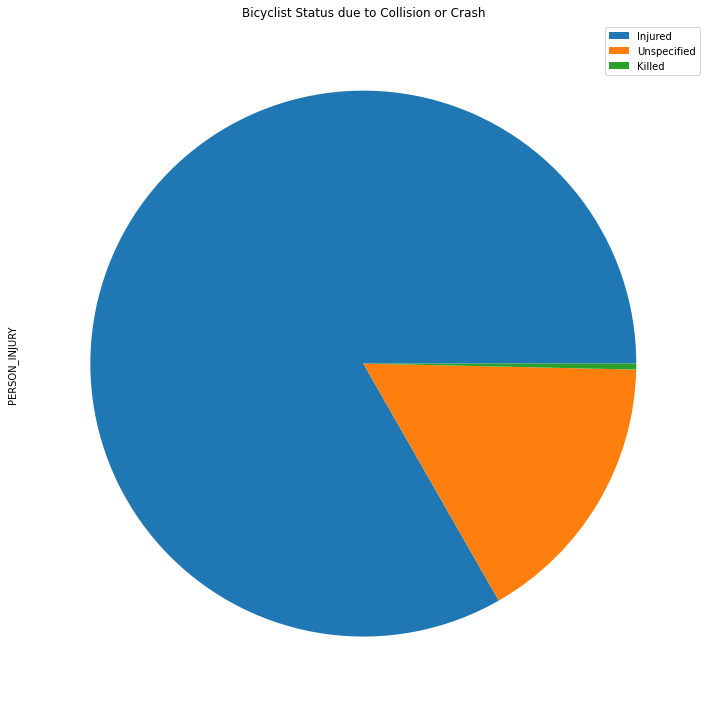

In [97]:
#
vmvbu['PERSON_INJURY'].value_counts().plot.pie(figsize=(10,10),legend=True,labeldistance=None,title='Bicyclist Status due to Collision or Crash')

Text(0.5, 0.98, 'NYC Collisions-Crashes\nINJURED KILLED UNSPECIFIED - Collision ID\n07-01-2012  -  07-31-2022')

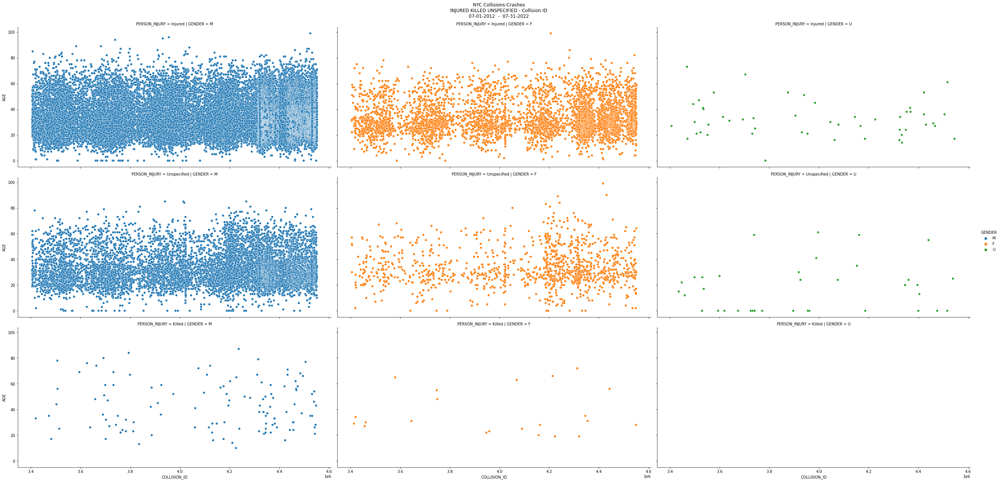

In [98]:
#
gpi=sns.relplot(data=vmvbu,x='COLLISION_ID',y='AGE',col='GENDER',row='PERSON_INJURY',hue='GENDER',kind='scatter',legend='auto',height=6,aspect=2)
#rp is a FacetGrid; 
#relplot is a nice organized way to use it
gpi.fig.subplots_adjust(top=0.93)#adjust the Figure in rp
gpi.fig.suptitle('NYC Collisions-Crashes\nINJURED KILLED UNSPECIFIED - Collision ID\n07-01-2012  -  07-31-2022')

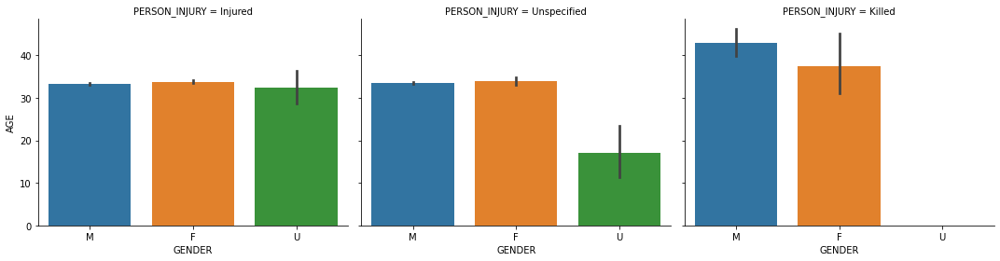

In [99]:
#
vzv=sns.FacetGrid(data=vmvbu,col='PERSON_INJURY',hue='GENDER',height=4,aspect=1.25)
vzv.map(sns.barplot,'GENDER','AGE',order=['M','F','U'])

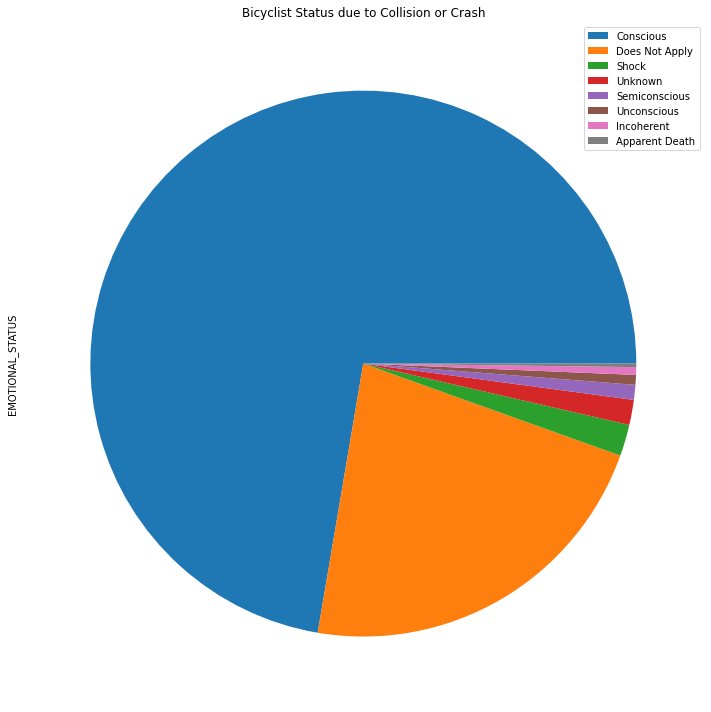

In [100]:
#
vmvbu['EMOTIONAL_STATUS'].value_counts().plot.pie(figsize=(10,10),legend=True,labeldistance=None,title='Bicyclist Status due to Collision or Crash')

In [ ]:
#
gesr=sns.relplot(data=vmvbu,x='COLLISION_ID',y='AGE',col='GENDER',row='EMOTIONAL_STATUS',hue='GENDER',kind='scatter',legend='auto',height=6,aspect=2)
#rp is a FacetGrid; 
#relplot is a nice organized way to use it
gesr.fig.subplots_adjust(top=0.96)#adjust the Figure in rp
gesr.fig.suptitle('NYC Collisions-Crashes\nEMOTIONAL STATUS - Collision ID\n07-01-2012  -  07-31-2022')

In [ ]:
#
vzvbi=sns.FacetGrid(data=vmvbu,col='EMOTIONAL_STATUS',hue='GENDER',height=4,aspect=1.25,col_wrap=4)
vzvbi.map(sns.barplot,'GENDER','AGE',order=['M','F','U'])

In [ ]:
#
vmvbu['COMPLAINT'].value_counts().plot.pie(figsize=(10,10),legend=True,labeldistance=None,title='Bicyclist Status due to Collision or Crash')

In [ ]:
#
gcr=sns.relplot(data=vmvbu,x='COLLISION_ID',y='AGE',col='GENDER',row='COMPLAINT',hue='GENDER',kind='scatter',legend='auto',height=6,aspect=2)
gcr.fig.subplots_adjust(top=0.97)
gcr.fig.suptitle('NYC Collisions-Crashes\nCOMPLAINT - Collision ID\n07-01-2012  -  07-31-2022')

In [ ]:
#
vzvbi=sns.FacetGrid(data=vmvbu,col='COMPLAINT',hue='GENDER',height=4,aspect=1.25,col_wrap=3)
vzvbi.map(sns.barplot,'GENDER','AGE',order=['M','F','U'])
#plt.title("Bicyclists Bodily InjuriesY\nNYC Collisions-Crashes\n2018")

In [ ]:
#
vmvbu['BODILY_INJURY'].value_counts().plot.pie(figsize=(10,10),legend=True,labeldistance=None,title='Bicyclist Status due to Collision or Crash')

In [ ]:
#
 gbi=sns.relplot(data=vmvbu,x='COLLISION_ID',y='AGE',col='GENDER',row='BODILY_INJURY',hue='GENDER',kind='scatter',legend='auto',height=6,aspect=2)
#rp is a FacetGrid; 
#relplot is a nice organized way to use it
gbi.fig.subplots_adjust(top=0.97)#adjust the Figure in rp
gbi.fig.suptitle('NYC Collisions-Crashes\nBODILY INJURY - Collision ID\n07-01-2012  -  07-31-2022')

In [ ]:
#
 vzvbi=sns.FacetGrid(data=vmvbu,col='BODILY_INJURY',hue='GENDER',height=4,aspect=1.25,col_wrap=7)
vzvbi.map(sns.barplot,'GENDER','AGE',order=['M','F','U'])
#plt.title("Bicyclists Bodily InjuriesY\nNYC Collisions-Crashes\n2018")

In [ ]:
#
vmvbu['SAFETY_EQUIPMENT'].value_counts().plot.pie(figsize=(10,10),legend=True,labeldistance=None,title='Bicyclist Status due to Collision or Crash')

In [ ]:
#
 gse=sns.relplot(data=vmvbu,x='COLLISION_ID',y='AGE',col='GENDER',row='SAFETY_EQUIPMENT',hue='GENDER',kind='scatter',legend='auto',height=6,aspect=2)
#rp is a FacetGrid; 
#relplot is a nice organized way to use it
gse.fig.subplots_adjust(top=0.97)#adjust the Figure in rp
gse.fig.suptitle('NYC Collisions-Crashes\nSAFETY EQUIPMENT - Collision ID\n07-01-2012  -  07-31-2022')

In [ ]:
#
 vzvbi=sns.FacetGrid(data=vmvbu,col='SAFETY_EQUIPMENT',hue='GENDER',height=4,aspect=1.25,col_wrap=7)
vzvbi.map(sns.barplot,'GENDER','AGE',order=['M','F','U'])
#plt.title("Bicyclists Bodily InjuriesY\nNYC Collisions-Crashes\n2018")

In [ ]:
#
vmvbu['POSITION_IN_VEHICLE'].value_counts().plot.pie(figsize=(10,10),legend=True,labeldistance=None,title='Bicyclist Status due to Collision or Crash')

In [ ]:
#
 gpv=sns.relplot(data=vmvbu,x='COLLISION_ID',y='AGE',col='GENDER',row='POSITION_IN_VEHICLE',hue='GENDER',kind='scatter',legend='auto',height=6,aspect=2)
#rp is a FacetGrid; 
#relplot is a nice organized way to use it
gpv.fig.subplots_adjust(top=0.97)#adjust the Figure in rp
gpv.fig.suptitle('NYC Collisions-Crashes\nPOSITION IN VEHICLE - Collision ID\n07-01-2012  -  07-31-2022')

#**DataFrame** 01/2018-2022-update on file

In [103]:
#
vmvbu18p=pd.DataFrame(vmvbu)

In [104]:
#
date_biclycle=vmvbu18p[(vmvbu18p['DATE']<'2018-01-01')].index
vmvbu18p.drop(date_biclycle,inplace=True)

In [105]:
#
vmvbu18p.shape

(29681, 22)

In [106]:
#
vmvbu18p.head(2)

,UNIQUE_ID,COLLISION_ID,DATE,TIME,PERSON_TYPE,PERSON_INJURY,AGE,EJECTION,EMOTIONAL_STATUS,BODILY_INJURY,POSITION_IN_VEHICLE,SAFETY_EQUIPMENT,COMPLAINT,PED_ROLE,GENDER,DATE_TIME,YEAR,MONTH,DAY,YEAR_MONTH,MONTH_YEAR,YMD_HMS
18,10254556,4230715,2019-10-26,8:50,Bicyclist,Injured,42,Not Ejected,Unknown,Knee-Lower Leg Foot,Driver,Unknown,None Visible,Driver,M,2019-10-26 08:50:00,2019,10,26,2019-10,10-2019,2019-10-26 08:50:00
31,10250834,4230376,2019-10-26,19:40,Bicyclist,Injured,36,Not Ejected,Conscious,Back,Driver,None,Internal,Driver,M,2019-10-26 19:40:00,2019,10,26,2019-10,10-2019,2019-10-26 19:40:00


###Column uniques

In [107]:
#
print(vmvbu18p['GENDER'].unique())

['M' 'F' 'U']


In [108]:
#
print(vmvbu18p['PERSON_TYPE'].unique())

['Bicyclist']


In [109]:
#
print(vmvbu18p['EMOTIONAL_STATUS'].unique())

['Unknown' 'Conscious' 'Does Not Apply' 'Shock' 'Incoherent' 'Unconscious'
 'Semiconscious' 'Apparent Death']


In [110]:
#
print(vmvbu18p['BODILY_INJURY'].unique())

['Knee-Lower Leg Foot' 'Back' 'Elbow-Lower-Arm-Hand' 'Hip-Upper Leg'
 'Neck' 'Does Not Apply' 'Shoulder - Upper Arm' 'Entire Body' 'Head'
 'Face' 'Chest' 'Unknown' 'Eye' 'Abdomen - Pelvis']


In [111]:
#
print(vmvbu18p['PERSON_INJURY'].unique())

['Injured' 'Unspecified' 'Killed']


In [112]:
#
print(vmvbu18p['SAFETY_EQUIPMENT'].unique())

['Unknown' 'None' 'Helmet Only (In-Line Skater/Bicyclist)'
 'Helmet/Other (In-Line Skater/Bicyclist)' 'Other' 'Lap Belt & Harness'
 'Helmet (Motorcycle Only)' 'Lap Belt'
 'Stoppers Only (In-Line Skater/Bicyclist)' 'Air Bag Deployed/Lap Belt'
 'Pads Only (In-Line Skater/Bicyclist)' 'Harness' 'Child Restraint Only']


In [113]:
#
print(vmvbu18p['MONTH_YEAR'].unique())

['10-2019' '06-2020' '08-2019' '11-2020' '11-2019' '05-2020' '08-2018'
 '09-2019' '05-2018' '11-2018' '09-2018' '12-2018' '03-2019' '10-2018'
 '05-2019' '03-2018' '04-2018' '02-2019' '06-2018' '07-2019' '04-2019'
 '01-2019' '02-2018' '07-2018' '06-2019' '01-2018' '10-2020' '05-2022'
 '07-2020' '09-2020' '04-2020' '03-2020' '02-2020' '08-2020' '12-2019'
 '01-2020' '12-2020' '06-2022' '07-2022' '01-2021' '02-2021' '04-2022'
 '03-2021' '03-2022' '04-2021' '01-2022' '06-2021' '05-2021' '08-2022'
 '07-2021' '08-2021' '09-2021' '10-2021' '11-2021' '12-2021' '02-2022']


In [114]:
#
#Total counts of Persons Injured
print('Person Injury: \n',vmvbu18p['PERSON_INJURY'].value_counts())

Person Injury: 
 Injured        22916
Unspecified     6664
Killed           101
Name: PERSON_INJURY, dtype: int64


In [115]:
#
#Total counts by Gender of Persons Injured
print('Gender of Persons Injured: \n',vmvbu18p['GENDER'].value_counts())

Gender of Persons Injured: 
 M    25630
F     4001
U       50
Name: GENDER, dtype: int64


In [116]:
#
#Total counts by Emotional Status of Persons Injured
print('Emotional Status at time of incident: \n',vmvbu18p['EMOTIONAL_STATUS'].value_counts())

Emotional Status at time of incident: 
 Conscious         21399
Does Not Apply     6672
Shock               582
Unknown             409
Semiconscious       245
Unconscious         177
Incoherent          134
Apparent Death       63
Name: EMOTIONAL_STATUS, dtype: int64


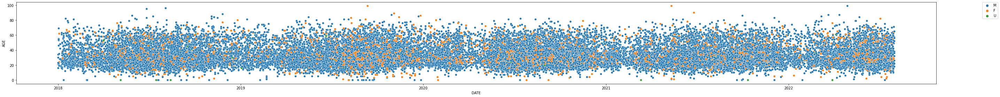

In [117]:
#
sns.scatterplot(data=vmvbu18p,x='DATE',y='AGE',hue='GENDER')
plt.legend(bbox_to_anchor=(1.05,1),loc='upper left',borderaxespad=0)

In [118]:
#
vmvbu18p.groupby( ['GENDER','PERSON_INJURY'])['AGE'].mean().sort_values(ascending=True)

GENDER  PERSON_INJURY
U       Unspecified      21.550000
        Injured          31.566667
M       Injured          33.707338
        Unspecified      34.048938
F       Injured          34.191896
        Unspecified      34.395787
        Killed           36.214286
M       Killed           42.264368
Name: AGE, dtype: float64

In [119]:
#
vmvbu18p.groupby( ['GENDER','PERSON_INJURY'])['AGE'].median().sort_values(ascending=True)

GENDER  PERSON_INJURY
U       Unspecified      22.0
F       Killed           28.0
U       Injured          29.5
F       Injured          31.0
        Unspecified      31.0
M       Injured          31.0
        Unspecified      31.0
        Killed           42.0
Name: AGE, dtype: float64

In [120]:
#
vmvbu18p.groupby(['GENDER','EMOTIONAL_STATUS'])['AGE'].mean().sort_values(ascending=True)

GENDER  EMOTIONAL_STATUS
U       Does Not Apply      21.368421
F       Apparent Death      24.333333
U       Shock               30.000000
        Unknown             30.000000
        Conscious           31.407407
M       Unknown             32.511429
        Shock               33.143763
        Conscious           33.690637
U       Semiconscious       34.000000
F       Shock               34.018519
M       Does Not Apply      34.039659
F       Conscious           34.162417
        Unknown             34.315789
        Does Not Apply      34.462389
        Incoherent          35.062500
        Semiconscious       35.208333
M       Unconscious         35.454545
        Incoherent          36.593220
        Semiconscious       36.750000
F       Unconscious         37.869565
M       Apparent Death      42.666667
Name: AGE, dtype: float64

In [121]:
#
vmvbu18p.groupby(['GENDER','EMOTIONAL_STATUS'])['AGE'].median().sort_values(ascending=True)

GENDER  EMOTIONAL_STATUS
U       Does Not Apply      20.0
F       Apparent Death      24.0
U       Conscious           28.0
M       Unknown             30.0
U       Shock               30.0
        Unknown             30.0
F       Unconscious         31.0
M       Conscious           31.0
        Shock               31.0
F       Does Not Apply      31.0
        Conscious           31.0
        Shock               31.0
M       Does Not Apply      31.0
F       Semiconscious       32.5
M       Incoherent          32.5
F       Unknown             33.0
M       Unconscious         33.5
        Semiconscious       34.0
F       Incoherent          34.0
U       Semiconscious       34.0
M       Apparent Death      43.0
Name: AGE, dtype: float64

In [122]:
#
vmvbu18p.groupby(['GENDER','EMOTIONAL_STATUS'])['AGE'].median().sort_values(ascending=True)

GENDER  EMOTIONAL_STATUS
U       Does Not Apply      20.0
F       Apparent Death      24.0
U       Conscious           28.0
M       Unknown             30.0
U       Shock               30.0
        Unknown             30.0
F       Unconscious         31.0
M       Conscious           31.0
        Shock               31.0
F       Does Not Apply      31.0
        Conscious           31.0
        Shock               31.0
M       Does Not Apply      31.0
F       Semiconscious       32.5
M       Incoherent          32.5
F       Unknown             33.0
M       Unconscious         33.5
        Semiconscious       34.0
F       Incoherent          34.0
U       Semiconscious       34.0
M       Apparent Death      43.0
Name: AGE, dtype: float64

###sort_values

In [123]:
#
#vmvbu18p.set_index('Unique ID',inplace=True)
#vmvbu18p.sort_values(['DATE','TIME'],ascending=True,inplace=False).head(2)

##**Visualizations** 2018-2022


###- Vision Zero Bicycle Incidencts 01/2018 - 07/2022

None                                        15982
Unknown                                      4856
Helmet Only (In-Line Skater/Bicyclist)       4706
Helmet/Other (In-Line Skater/Bicyclist)      1379
Helmet (Motorcycle Only)                     1037
Lap Belt & Harness                            746
Other                                         669
Lap Belt                                      211
Stoppers Only (In-Line Skater/Bicyclist)       49
Pads Only (In-Line Skater/Bicyclist)           21
Harness                                        17
Child Restraint Only                            6
Air Bag Deployed/Lap Belt                       2
Name: SAFETY_EQUIPMENT, dtype: int64


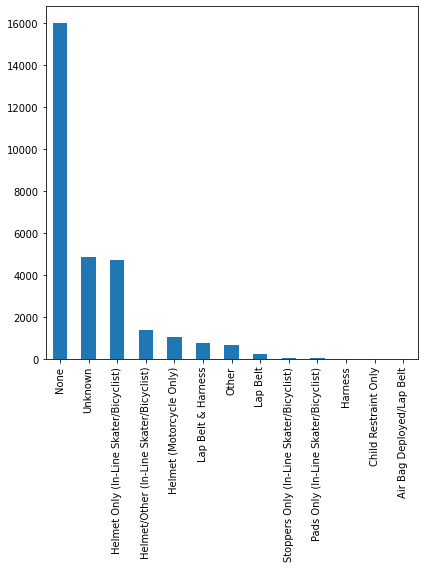

In [124]:
#
plt.figure(figsize=(6,8))
x=pd.value_counts(vmvbu18p['SAFETY_EQUIPMENT'].values, sort=True)
x.plot.bar()
print(vmvbu18p['SAFETY_EQUIPMENT'].value_counts())
#sns.lmplot(data=vmvbu18p,x=x,y='AGE',col='PERSON_INJURY',hue='GENDER')
#grouped_vmvbu18p.set_xticklabels(grouped_vmvbu18p.get_xticklabels(),rotation=30)

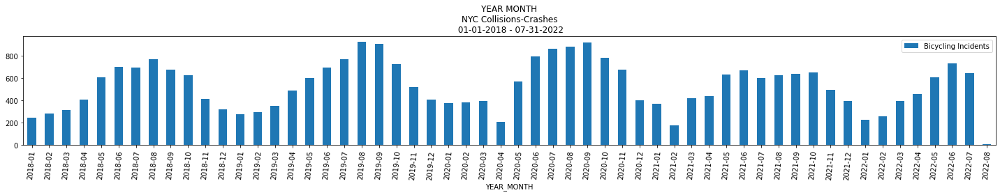

In [125]:
#
#create a representation of the month with strfmt
grouped_vmvbu18p=vmvbu18p.groupby('YEAR_MONTH').size().to_frame('Bicycling Incidents').reset_index()
grouped_vmvbu18p.plot(kind='bar',x='YEAR_MONTH',y='Bicycling Incidents',figsize=(20,4),title='YEAR MONTH\nNYC Collisions-Crashes\n 01-01-2018 - 07-31-2022')
plt.xticks(rotation=85)
plt.show()



Text(0, 0.5, 'Bicycling Incidents')

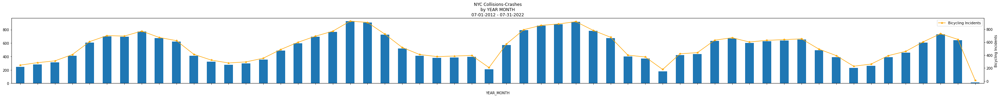

In [127]:
#
grouped_vmvbu18p=vmvbu18p.groupby('YEAR_MONTH').size().to_frame("Bicycling Incidents").reset_index()
plt.rcParams["figure.figsize"] = [40, 4]
plt.rcParams["figure.autolayout"] = True
ax = grouped_vmvbu18p.plot.bar(x='YEAR_MONTH',y='Bicycling Incidents',title='NYC Collisions-Crashes\nby YEAR MONTH\n07-01-2012 - 07-31-2022', legend=False)
grouped_vmvbu18p.plot(y='Bicycling Incidents', marker='*', color='orange', ax=ax, use_index=False,secondary_y=True, mark_right=False)

ax.set_xticklabels('                    ', rotation=15)
ax.right_ax.set_ylabel('Bicycling Incidents')
#plt.legend(bbox_to_anchor=(1.05,1),loc='upper left',borderaxespad=0)



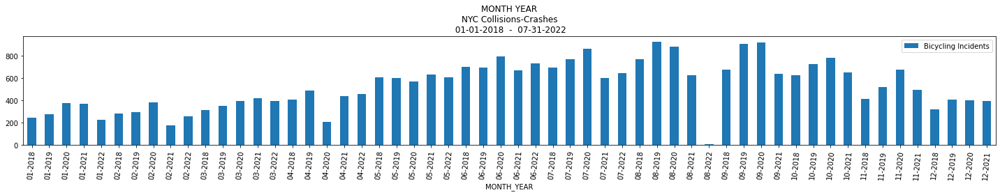

In [128]:
#
vmvbu18p['MONTH_YEAR']=vmvbu18p['DATE'].map(lambda dt: dt.strftime('%m-%Y'))
grouped_vmvbu18p=vmvbu18p.groupby('MONTH_YEAR').size().to_frame("Bicycling Incidents").reset_index()
grouped_vmvbu18p.plot(kind='bar',x='MONTH_YEAR',y='Bicycling Incidents',figsize=(20,4),title='MONTH YEAR\nNYC Collisions-Crashes\n 01-01-2018  -  07-31-2022')
plt.xticks(rotation=85)
plt.show()


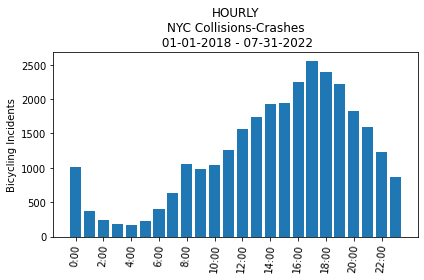

In [129]:
plt.figure(figsize=(6,4))
hourly2018_22=vmvbu18p['TIME'].str.split(':').str[0].astype('int').value_counts().sort_index()
plt.bar(hourly2018_22.index,hourly2018_22.values)
plt.xticks(range(0,24,2),[str(x)+":00" for x in range(0,24,2)])
plt.xlabel('')
plt.ylabel('Bicycling Incidents')
plt.title('HOURLY\nNYC Collisions-Crashes\n 01-01-2018 - 07-31-2022')
plt.xticks(rotation=85)
plt.show()

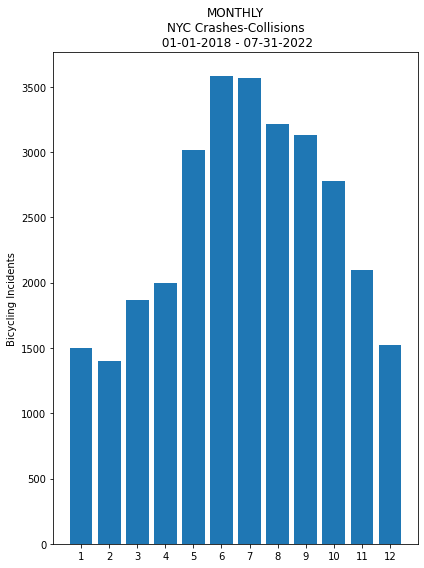

In [130]:
plt.figure(figsize=(6,8))
monthy2018_22=vmvbu18p['DATE'].dt.month.value_counts().sort_index()
plt.bar(monthy2018_22.index,monthy2018_22.values)
plt.xticks(range(1,13))
plt.xlabel('')
plt.ylabel('Bicycling Incidents')
plt.title('MONTHLY\nNYC Crashes-Collisions\n 01-01-2018 - 07-31-2022')
plt.show()
#2018 Higher crashes during the warmer months..increased usage of bikes - large touristic,schools out,additional drivers,additional bike share users. 

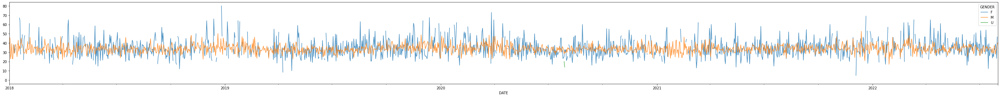

In [131]:
#
pd.pivot_table(vmvbu18p.reset_index(),index='DATE', columns='GENDER', values='AGE').plot(alpha=0.8)

In [132]:
#
print('Count of Incidents Catagorized by Gender:\n',vmvbu18p.groupby(['PERSON_INJURY','GENDER'])['AGE'].count().sort_values(ascending=False))

Count of Incidents Catagorized by Gender:
 PERSON_INJURY  GENDER
Injured        M         19801
Unspecified    M          5742
Injured        F          3085
Unspecified    F           902
Killed         M            87
Injured        U            30
Unspecified    U            20
Killed         F            14
Name: AGE, dtype: int64


In [133]:
#
vmvbu18p.groupby(['GENDER','PERSON_INJURY'])['AGE'].mean().sort_values(ascending=True)

GENDER  PERSON_INJURY
U       Unspecified      21.550000
        Injured          31.566667
M       Injured          33.707338
        Unspecified      34.048938
F       Injured          34.191896
        Unspecified      34.395787
        Killed           36.214286
M       Killed           42.264368
Name: AGE, dtype: float64

In [134]:
#
vmvbu18p.groupby(['GENDER','PERSON_INJURY'])['AGE'].median().sort_values(ascending=True)

GENDER  PERSON_INJURY
U       Unspecified      22.0
F       Killed           28.0
U       Injured          29.5
F       Injured          31.0
        Unspecified      31.0
M       Injured          31.0
        Unspecified      31.0
        Killed           42.0
Name: AGE, dtype: float64

<Figure size 432x576 with 0 Axes>

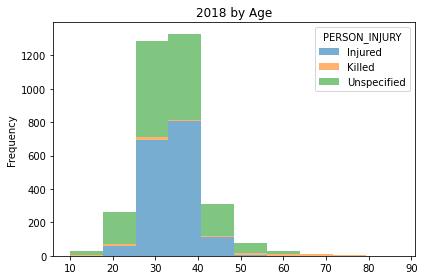

In [247]:
plt.figure(figsize=(6,8))
pd.pivot_table(vmvbu18p.reset_index(),index='DATE', columns='PERSON_INJURY', values='AGE').plot(kind='hist', stacked=True,figsize=(6,4), alpha=0.6, title='2018 by Age')

In [136]:
#
vmvbu18p.groupby(['PERSON_INJURY','GENDER'])['AGE'].mean()

PERSON_INJURY  GENDER
Injured        F         34.191896
               M         33.707338
               U         31.566667
Killed         F         36.214286
               M         42.264368
Unspecified    F         34.395787
               M         34.048938
               U         21.550000
Name: AGE, dtype: float64

In [137]:
#
vmvbu18p.groupby(['PERSON_INJURY','GENDER'])['AGE'].median()

PERSON_INJURY  GENDER
Injured        F         31.0
               M         31.0
               U         29.5
Killed         F         28.0
               M         42.0
Unspecified    F         31.0
               M         31.0
               U         22.0
Name: AGE, dtype: float64

In [138]:
#
vmvbu18p.groupby(['EMOTIONAL_STATUS','GENDER',])['AGE'].mean()

EMOTIONAL_STATUS  GENDER
Apparent Death    F         24.333333
                  M         42.666667
Conscious         F         34.162417
                  M         33.690637
                  U         31.407407
Does Not Apply    F         34.462389
                  M         34.039659
                  U         21.368421
Incoherent        F         35.062500
                  M         36.593220
Semiconscious     F         35.208333
                  M         36.750000
                  U         34.000000
Shock             F         34.018519
                  M         33.143763
                  U         30.000000
Unconscious       F         37.869565
                  M         35.454545
Unknown           F         34.315789
                  M         32.511429
                  U         30.000000
Name: AGE, dtype: float64

In [139]:
#
vmvbu18p.groupby(['EMOTIONAL_STATUS','GENDER'])['AGE'].median().sort_values(ascending=True)

EMOTIONAL_STATUS  GENDER
Does Not Apply    U         20.0
Apparent Death    F         24.0
Conscious         U         28.0
Shock             U         30.0
Unknown           M         30.0
                  U         30.0
Does Not Apply    M         31.0
Conscious         M         31.0
                  F         31.0
Shock             F         31.0
                  M         31.0
Unconscious       F         31.0
Does Not Apply    F         31.0
Incoherent        M         32.5
Semiconscious     F         32.5
Unknown           F         33.0
Unconscious       M         33.5
Incoherent        F         34.0
Semiconscious     M         34.0
                  U         34.0
Apparent Death    M         43.0
Name: AGE, dtype: float64

In [140]:
#
print('Rows: \n','Columns: \n',vmvbu18p.shape)

Rows: 
 Columns: 
 (29681, 22)


In [141]:
#
vmvbu18p.info()

<class 'pandas.core.frame.DataFrame'>
Int64Index: 29681 entries, 18 to 4759099
Data columns (total 22 columns):
 #   Column               Non-Null Count  Dtype         
---  ------               --------------  -----         
 0   UNIQUE_ID            29681 non-null  int64         
 1   COLLISION_ID         29681 non-null  int64         
 2   DATE                 29681 non-null  datetime64[ns]
 3   TIME                 29681 non-null  object        
 4   PERSON_TYPE          29681 non-null  object        
 5   PERSON_INJURY        29681 non-null  object        
 6   AGE                  29681 non-null  int64         
 7   EJECTION             29681 non-null  object        
 8   EMOTIONAL_STATUS     29681 non-null  object        
 9   BODILY_INJURY        29681 non-null  object        
 10  POSITION_IN_VEHICLE  29681 non-null  object        
 11  SAFETY_EQUIPMENT     29681 non-null  object        
 12  COMPLAINT            29681 non-null  object        
 13  PED_ROLE             29681 n

In [142]:
#
#Total counts by Emotional Status of Persons Injured
print('Person Injury: \n',vmvbu18p['GENDER'].value_counts())

Person Injury: 
 M    25630
F     4001
U       50
Name: GENDER, dtype: int64


##**DataFrame** - 2018 

In [144]:
#
vzb2018i=pd.DataFrame(vmvbu18p)

In [146]:
#
only2018bi=vzb2018i[(vzb2018i['DATE'] < '2018-01-01') | (vzb2018i['DATE'] > '2018-12-31')].index
vzb2018i.drop(only2018bi,inplace=True)

###Column uniques

In [147]:
#
print(vzb2018i['GENDER'].unique())

['M' 'F' 'U']


In [148]:
#
print(vzb2018i['PERSON_TYPE'].unique())

['Bicyclist']


In [149]:
#
print(vzb2018i['EMOTIONAL_STATUS'].unique())

['Conscious' 'Does Not Apply' 'Incoherent' 'Semiconscious' 'Shock'
 'Unconscious' 'Unknown' 'Apparent Death']


In [150]:
#
print(vzb2018i['BODILY_INJURY'].unique())

['Knee-Lower Leg Foot' 'Hip-Upper Leg' 'Does Not Apply' 'Back' 'Face'
 'Head' 'Entire Body' 'Elbow-Lower-Arm-Hand' 'Shoulder - Upper Arm'
 'Unknown' 'Neck' 'Abdomen - Pelvis' 'Chest' 'Eye']


In [151]:
#
print(vzb2018i['PERSON_INJURY'].unique())

['Injured' 'Unspecified' 'Killed']


##**Visualization** - 2018

####- Vision Zero Bicycle Incidencts 01/2018 - 12/2018

<Figure size 432x576 with 0 Axes>

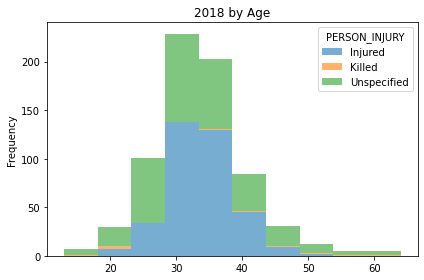

In [249]:
plt.figure(figsize=(6,8))
pd.pivot_table(vzb2018i.reset_index(),index='DATE', columns='PERSON_INJURY', values='AGE').plot(kind='hist', stacked=True,figsize=(6,4), alpha=0.6, title='2018 by Age')

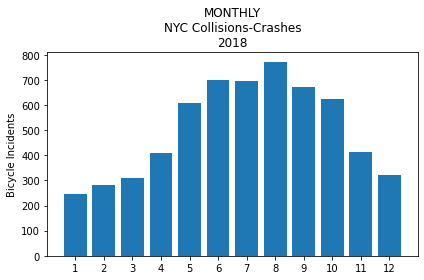

In [198]:
plt.figure(figsize=(6,4))
vzb18mc=vzb2018i['DATE'].dt.month.value_counts().sort_index()
plt.bar(vzb18mc.index,vzb18mc.values)
plt.xticks(range(1,13))
plt.xlabel('')
plt.ylabel('Bicycle Incidents')
plt.title('MONTHLY\nNYC Collisions-Crashes\n2018')
plt.show()
#2018 Higher crashes during the warmer months..increased usage of bikes. august is a large touristic(additional drivers,additional bike share users) month. 

2018 Higher crashes during the warmer months..increased usage of bikes. august is a large touristic(additional drivers,additional bike share users) month. 

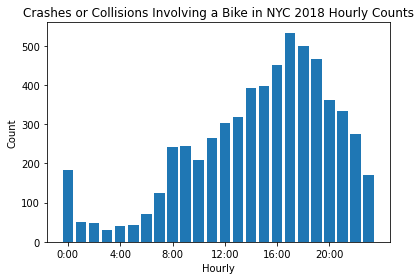

In [168]:
plt.figure(figsize=(6,4))
vzbctc=vzb2018i['TIME'].str.split(':').str[0].astype('int').value_counts().sort_index()
plt.bar(vzbctc.index,vzbctc.values)
plt.xticks(range(0,24,4),[str(x)+":00" for x in range(0,24,4)])
plt.xlabel('Hourly')
plt.ylabel('Count')
plt.title('Crashes or Collisions Involving a Bike in NYC 2018 Hourly Counts')
plt.show()

<Figure size 432x288 with 0 Axes>

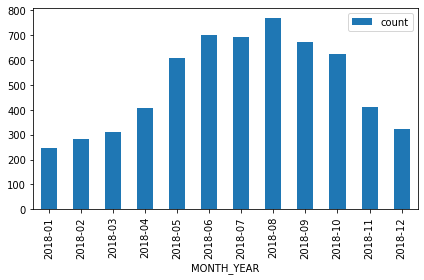

<Figure size 432x288 with 0 Axes>

In [171]:

#create a representation of the month with strfmt
vzb2018i['MONTH_YEAR']=vzb2018i['DATE'].map(lambda dt: dt.strftime('%Y-%m'))
grouped_vzb2018i=vzb2018i.groupby('MONTH_YEAR').size().to_frame("count").reset_index()
grouped_vzb2018i.plot(kind='bar',x='MONTH_YEAR',y='count',figsize=(6,4))
plt.figure(figsize=(6,4))
#sns.lmplot(data=vzb2018i,x='COLLISION_ID',y='TIME',col='PERSON_INJURY',hue='GENDER')

In [172]:
#
print(vzb2018i['BODILY_INJURY'].unique())

['Knee-Lower Leg Foot' 'Hip-Upper Leg' 'Does Not Apply' 'Back' 'Face'
 'Head' 'Entire Body' 'Elbow-Lower-Arm-Hand' 'Shoulder - Upper Arm'
 'Unknown' 'Neck' 'Abdomen - Pelvis' 'Chest' 'Eye']


In [165]:
#
print('Bodily Injury: \n',vzb2018i['BODILY_INJURY'].value_counts())

Bodily Injury: 
 Knee-Lower Leg Foot     1471
Does Not Apply          1318
Elbow-Lower-Arm-Hand     702
Head                     679
Shoulder - Upper Arm     461
Back                     310
Entire Body              290
Hip-Upper Leg            262
Face                     234
Neck                     146
Abdomen - Pelvis          75
Chest                     62
Unknown                   37
Eye                        5
Name: BODILY_INJURY, dtype: int64


In [166]:
#
print('Bicyclists involved Gender count:\n',vzb2018i['GENDER'].value_counts())

Bicyclists involved Gender count:
 M    5330
F     708
U      14
Name: GENDER, dtype: int64


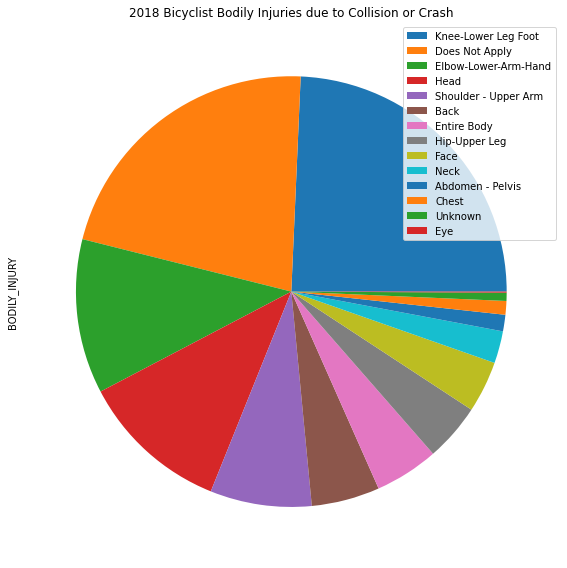

In [203]:
#
vzb2018i['BODILY_INJURY'].value_counts().plot.pie(figsize=(8,8),labeldistance=None,legend=True,title='2018 Bicyclist Bodily Injuries due to Collision or Crash')
#

###"Bicyclists Bodily Injuries\nNYC Collisions-Crashes\n2018"


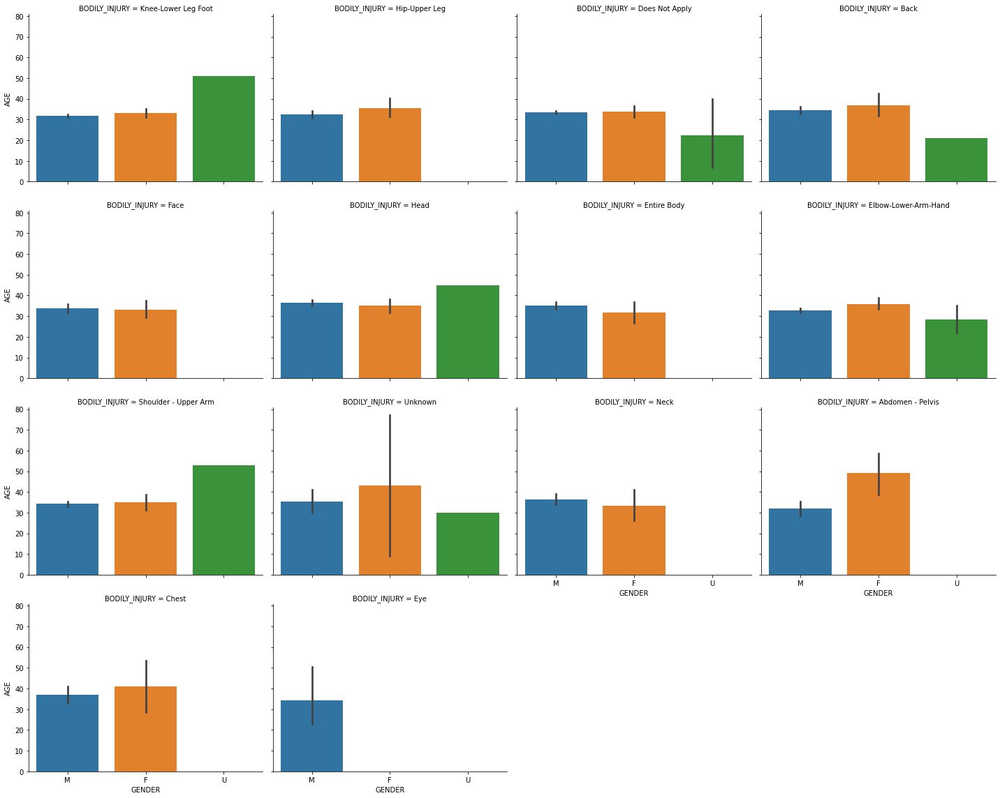

In [204]:
#
vzvb=sns.FacetGrid(data=vzb2018i,col='BODILY_INJURY',hue='GENDER',height=4,aspect=1.25,col_wrap=4)
vzvb.map(sns.barplot,'GENDER','AGE',order=['M','F','U'])
#plt.title("Bicyclists Bodily InjuriesY\nNYC Collisions-Crashes\n2018")

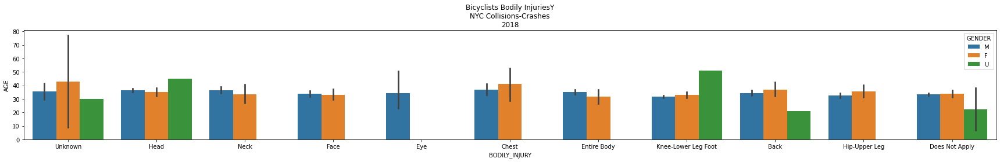

In [207]:
#
plt.figure(figsize=(24,4))
sns.barplot(data=vzb2018i,x='BODILY_INJURY',y='AGE',hue='GENDER',order=['Unknown','Head','Neck','Face','Eye','Chest','Entire Body','Knee-Lower Leg Foot','Back','Hip-Upper Leg','Does Not Apply'])
plt.title("Bicyclists Bodily InjuriesY\nNYC Collisions-Crashes\n2018")
plt.show()

###"Bicyclists Emotional Status\nNYC Collisions-Crashes\n2018"

In [177]:
#
print('Emotional Status: \n',vzb2018i['EMOTIONAL_STATUS'].value_counts())

Emotional Status: 
 Conscious         4462
Does Not Apply    1321
Shock               90
Unknown             63
Semiconscious       57
Unconscious         31
Incoherent          23
Apparent Death       5
Name: EMOTIONAL_STATUS, dtype: int64


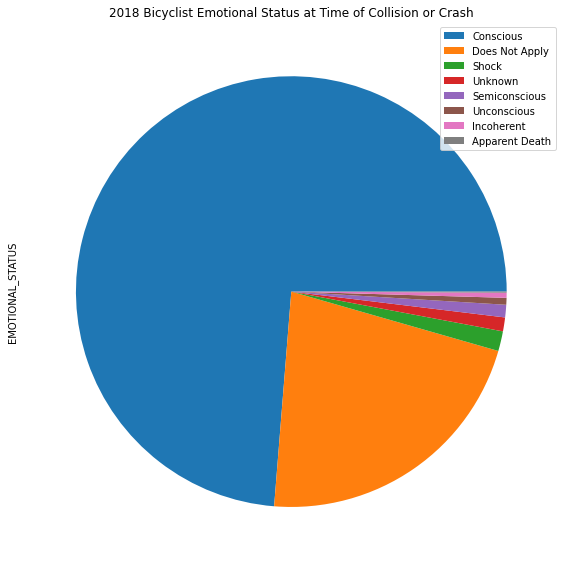

In [208]:
#
vzb2018i['EMOTIONAL_STATUS'].value_counts().plot.pie(figsize=(8,8),legend=True,labeldistance=None,title='2018 Bicyclist Emotional Status at Time of Collision or Crash')

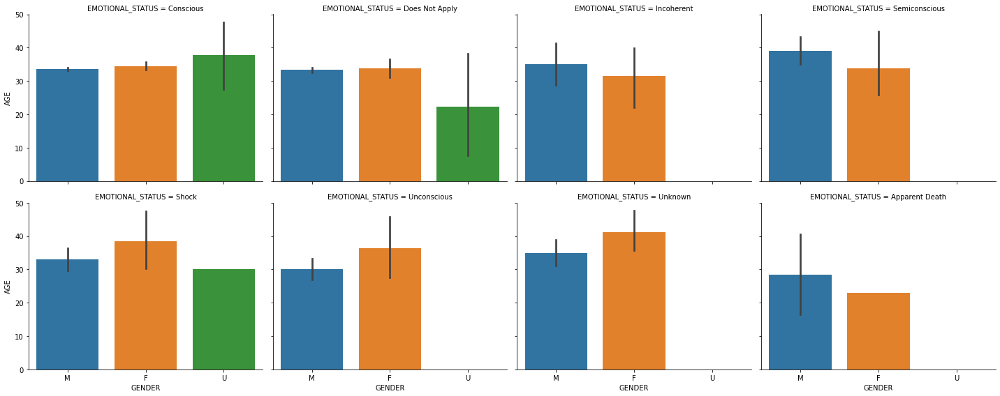

In [209]:
#
vzvb=sns.FacetGrid(data=vzb2018i,col='EMOTIONAL_STATUS',hue='GENDER',height=4,aspect=1.25,col_wrap=4)
vzvb.map(sns.barplot,'GENDER','AGE',order=['M','F','U'])

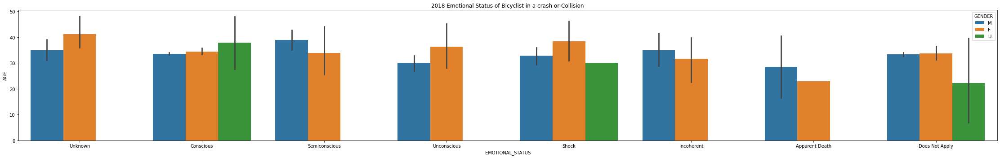

In [182]:
#
plt.figure(figsize=(31,5))
sns.barplot(data=vzb2018i,x='EMOTIONAL_STATUS',y='AGE',hue='GENDER',order=['Unknown','Conscious','Semiconscious','Unconscious','Shock','Incoherent','Apparent Death','Does Not Apply'])
plt.title("2018 Emotional Status of Bicyclist in a crash or Collision")
plt.show()
#Unknown seem to be soley concious

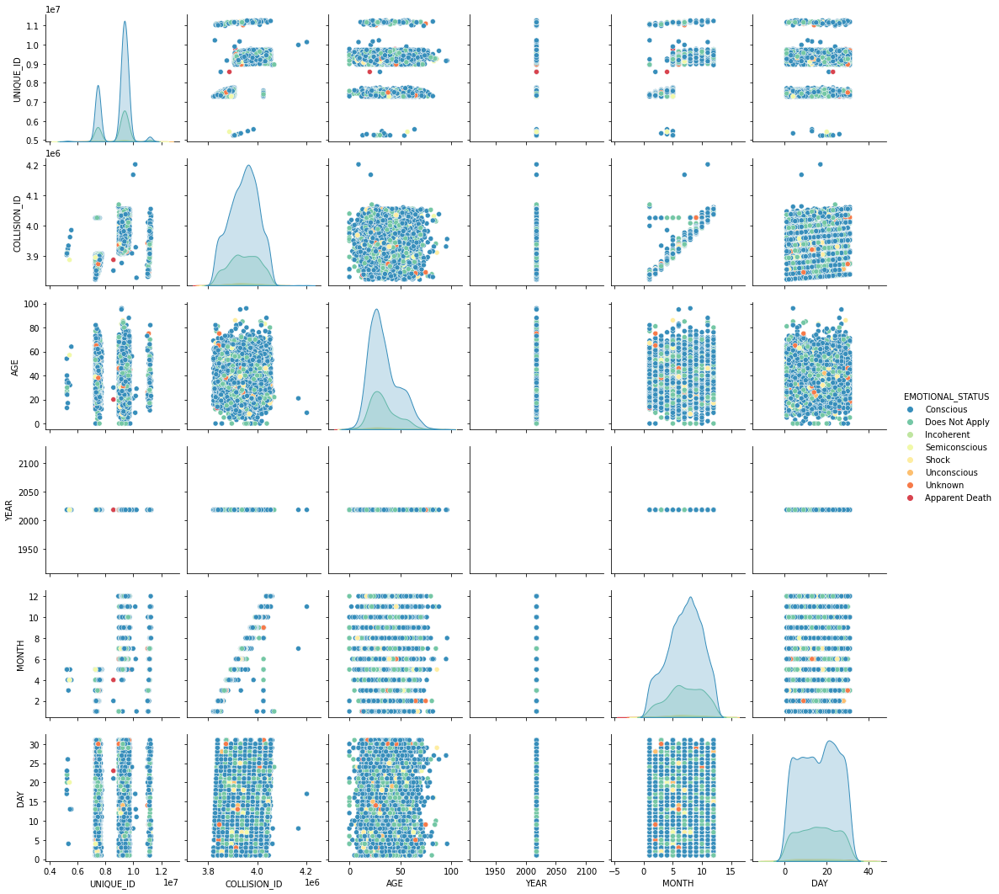

In [183]:
#
sns.pairplot(data=vzb2018i,hue='EMOTIONAL_STATUS',palette='Spectral_r') 

In [184]:
#
print('Person Injury: \n',vzb2018i['PERSON_INJURY'].value_counts())

Person Injury: 
 Injured        4724
Unspecified    1318
Killed           10
Name: PERSON_INJURY, dtype: int64


In [185]:
#
vzb2018i['PERSON_INJURY'].value_counts().sum()

6052

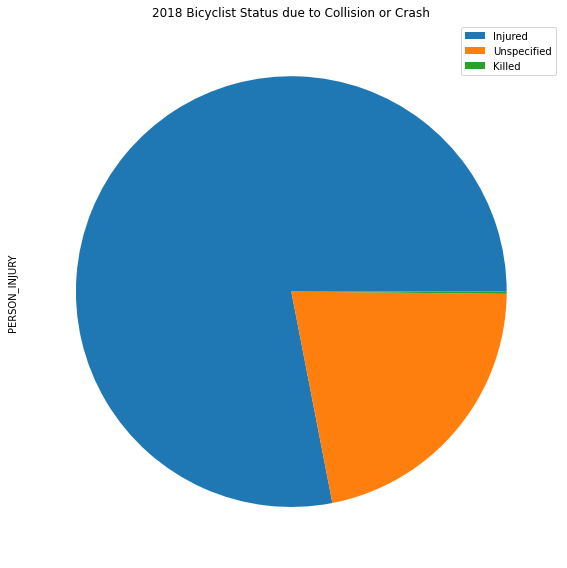

In [210]:
#
vzb2018i['PERSON_INJURY'].value_counts().plot.pie(figsize=(8,8),legend=True,labeldistance=None,title='2018 Bicyclist Status due to Collision or Crash')

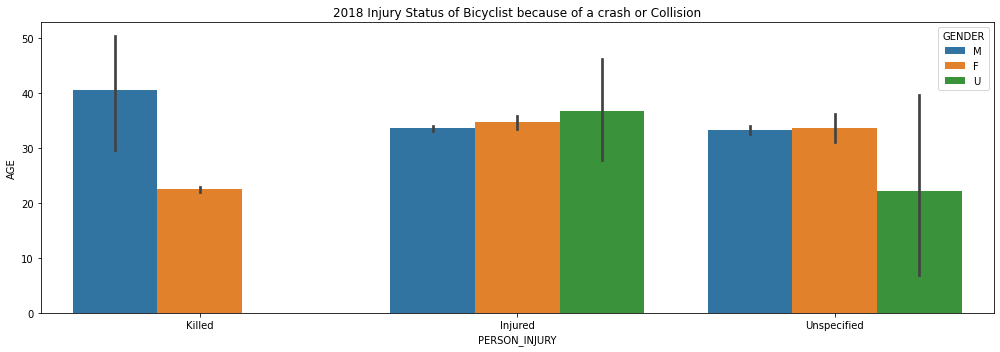

In [186]:
#
plt.figure(figsize=(14,5))
sns.barplot(data=vzb2018i,x='PERSON_INJURY',y='AGE',hue='GENDER',order=['Killed','Injured','Unspecified'])
plt.title("2018 Injury Status of Bicyclist because of a crash or Collision")
plt.show()
#U

In [188]:
#
print(vzb2018i['SAFETY_EQUIPMENT'].unique())

['None' 'Stoppers Only (In-Line Skater/Bicyclist)'
 'Helmet Only (In-Line Skater/Bicyclist)' 'Unknown'
 'Helmet/Other (In-Line Skater/Bicyclist)' 'Helmet (Motorcycle Only)'
 'Other' 'Lap Belt' 'Lap Belt & Harness' 'Air Bag Deployed/Lap Belt'
 'Pads Only (In-Line Skater/Bicyclist)' 'Harness' 'Child Restraint Only']


In [189]:
#
#Total counts of Persons Injured
print('Person Injury: \n',vzb2018i['PERSON_INJURY'].value_counts())

Person Injury: 
 Injured        4724
Unspecified    1318
Killed           10
Name: PERSON_INJURY, dtype: int64


Person Injury: 
 AxesSubplot(0.125,0.125;0.775x0.755)


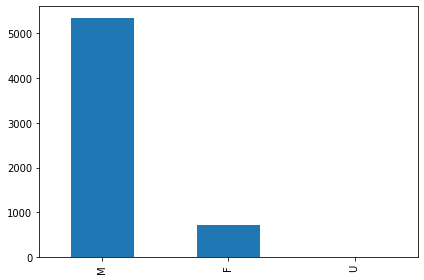

In [212]:
#
#Total counts by Gender of Persons Injured
print('Person Injury: \n',vzb2018i['GENDER'].value_counts().plot.bar(figsize=(6,4)))

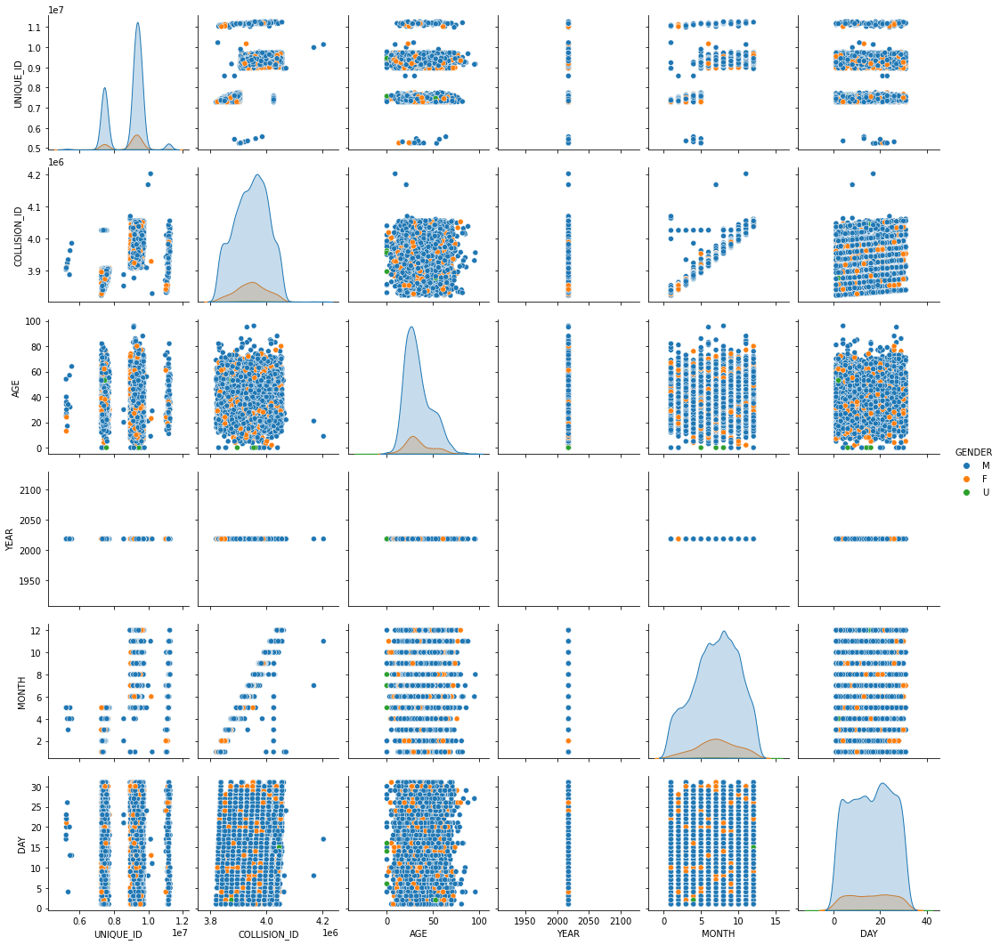

In [193]:
#
sns.pairplot(data=vzb2018i,hue='GENDER') 

In [194]:
#
vzb2018i.groupby(['GENDER','PERSON_INJURY'])['AGE'].mean().sort_values(ascending=True)

GENDER  PERSON_INJURY
U       Unspecified      22.285714
F       Killed           22.500000
M       Unspecified      33.378698
        Injured          33.603286
F       Unspecified      33.750000
        Injured          34.709343
U       Injured          36.714286
M       Killed           40.500000
Name: AGE, dtype: float64

In [195]:
#
#sns.plot(data=vzb2018i.groupby(['GENDER','PERSON_INJURY'])[ 'AGE'].mean().sort_values(ascending=True)

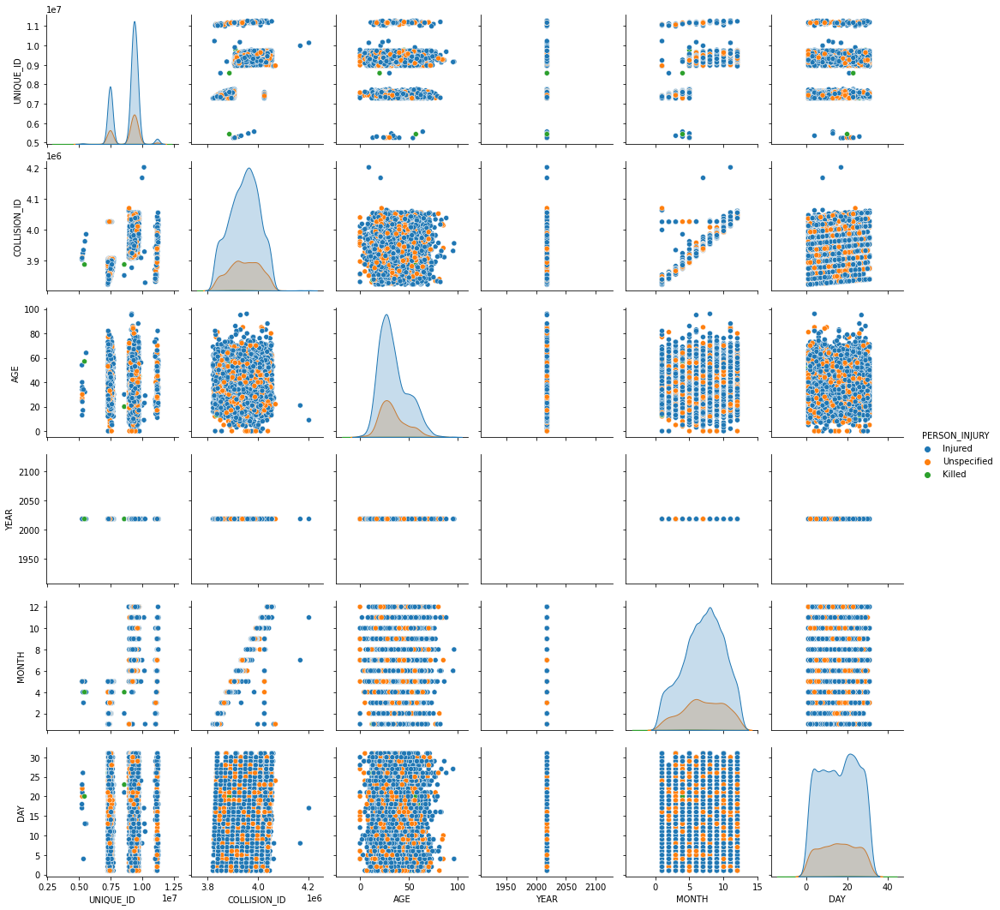

In [196]:
#
sns.pairplot(data=vzb2018i,hue='PERSON_INJURY',height=2.5) 

In [213]:
#
vzb2018i.groupby(['GENDER','BODILY_INJURY'])['AGE'].mean().sort_values(ascending=True)

GENDER  BODILY_INJURY       
U       Back                    21.000000
        Does Not Apply          22.285714
        Elbow-Lower-Arm-Hand    28.500000
        Unknown                 30.000000
F       Entire Body             31.774194
M       Knee-Lower Leg Foot     31.847708
        Abdomen - Pelvis        31.923077
        Hip-Upper Leg           32.419643
        Elbow-Lower-Arm-Hand    32.757329
F       Knee-Lower Leg Foot     33.103825
        Face                    33.194444
M       Does Not Apply          33.378698
F       Neck                    33.428571
M       Face                    33.707071
F       Does Not Apply          33.750000
M       Shoulder - Upper Arm    34.201946
        Eye                     34.400000
        Back                    34.478873
F       Head                    34.980000
        Shoulder - Upper Arm    35.000000
M       Entire Body             35.138996
        Unknown                 35.382353
F       Hip-Upper Leg           35.578947
     

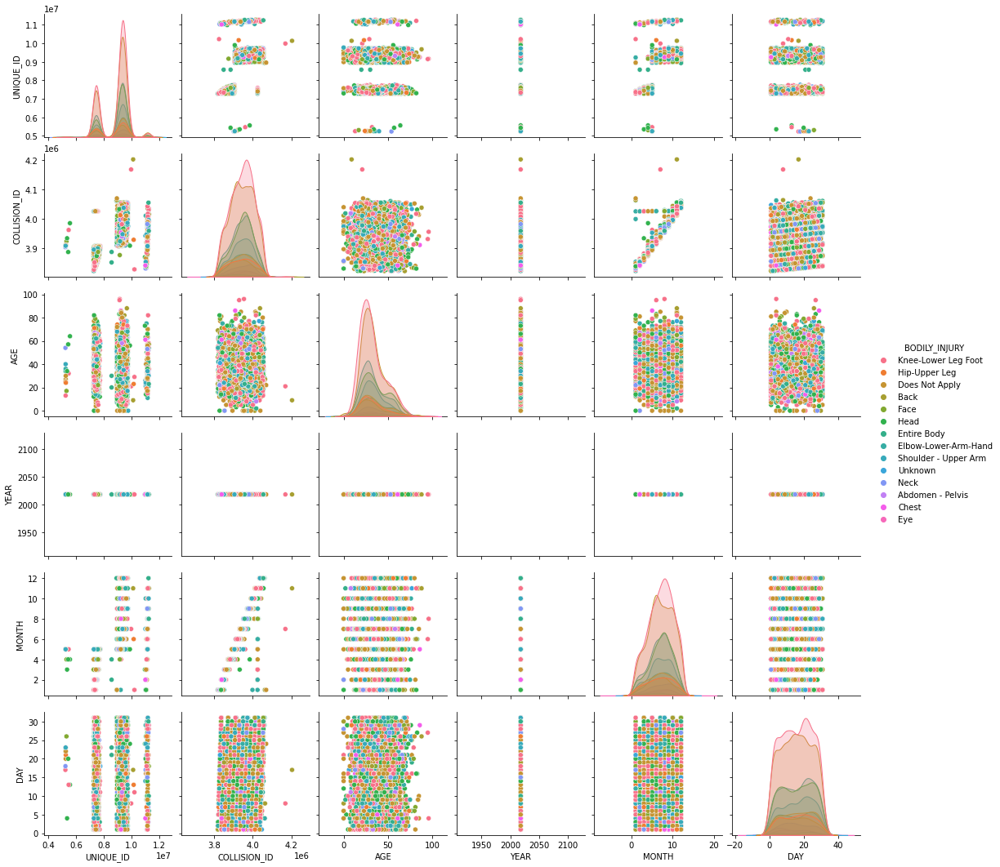

In [214]:
#
sns.pairplot(data=vzb2018i,hue='BODILY_INJURY') 

In [215]:
#
vzb2018i.groupby(['GENDER','PED_ROLE'])['AGE'].mean().sort_values(ascending=True)

GENDER  PED_ROLE 
U       Passenger    15.000000
M       Passenger    26.863636
F       Passenger    27.318182
U       Driver       31.916667
M       Driver       33.619561
F       Driver       34.731778
Name: AGE, dtype: float64

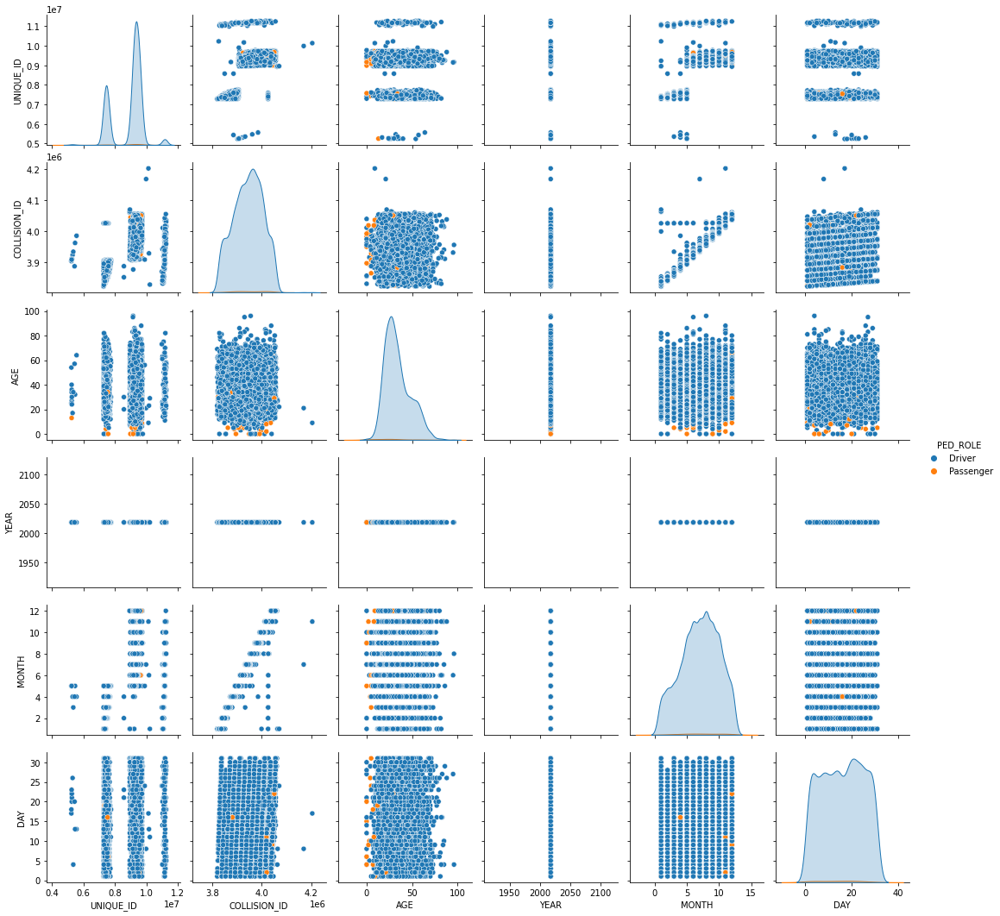

In [216]:
#
sns.pairplot(data=vzb2018i,hue='PED_ROLE') 

In [217]:
#
vzb2018i.groupby(['GENDER','EMOTIONAL_STATUS'])['AGE'].mean().sort_values(ascending=True)

GENDER  EMOTIONAL_STATUS
U       Does Not Apply      22.285714
F       Apparent Death      23.000000
M       Apparent Death      28.500000
U       Shock               30.000000
M       Unconscious         30.083333
F       Incoherent          31.600000
M       Shock               32.943662
        Does Not Apply      33.329680
        Conscious           33.578639
F       Does Not Apply      33.750000
        Semiconscious       33.875000
        Conscious           34.484053
M       Unknown             34.963636
        Incoherent          35.000000
F       Unconscious         36.285714
U       Conscious           37.833333
F       Shock               38.444444
M       Semiconscious       38.959184
F       Unknown             41.125000
Name: AGE, dtype: float64

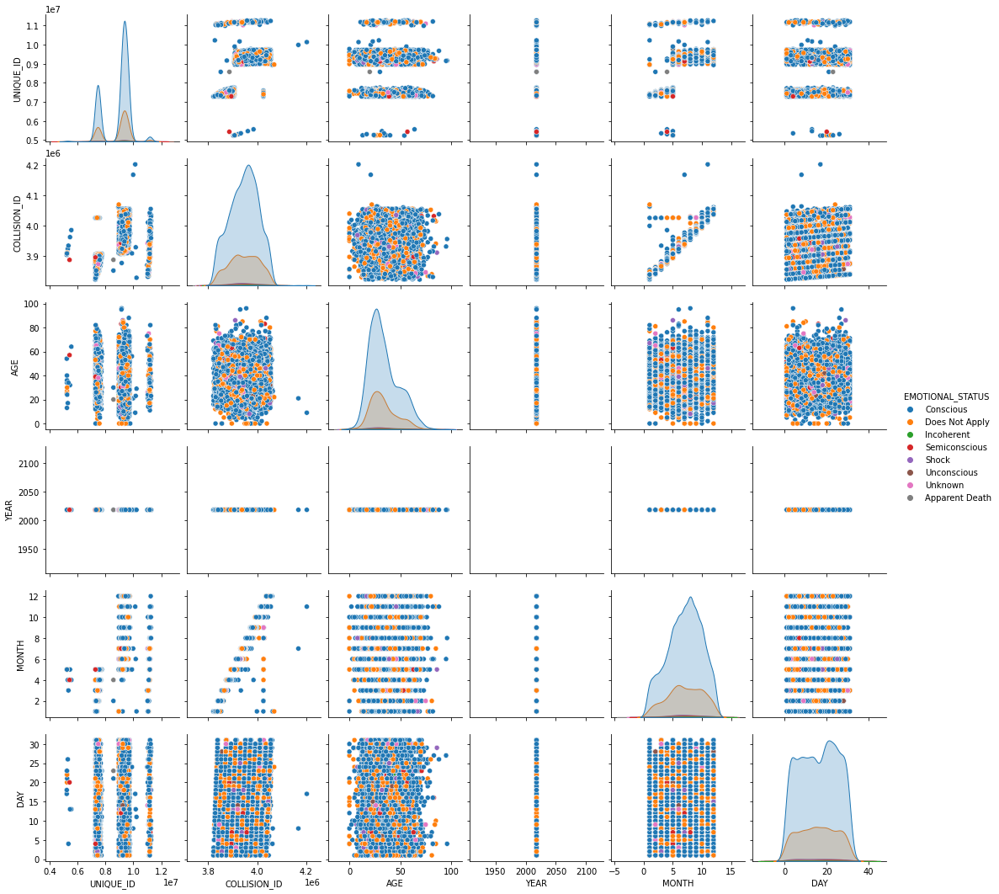

In [218]:
#
sns.pairplot(data=vzb2018i,hue='EMOTIONAL_STATUS') 

In [219]:
#
print('Bodily Injury: \n',vzb2018i['BODILY_INJURY'].value_counts())

Bodily Injury: 
 Knee-Lower Leg Foot     1471
Does Not Apply          1318
Elbow-Lower-Arm-Hand     702
Head                     679
Shoulder - Upper Arm     461
Back                     310
Entire Body              290
Hip-Upper Leg            262
Face                     234
Neck                     146
Abdomen - Pelvis          75
Chest                     62
Unknown                   37
Eye                        5
Name: BODILY_INJURY, dtype: int64


In [220]:
#
print('Bicyclists involved Gender count:\n',vzb2018i['GENDER'].value_counts())

Bicyclists involved Gender count:
 M    5330
F     708
U      14
Name: GENDER, dtype: int64


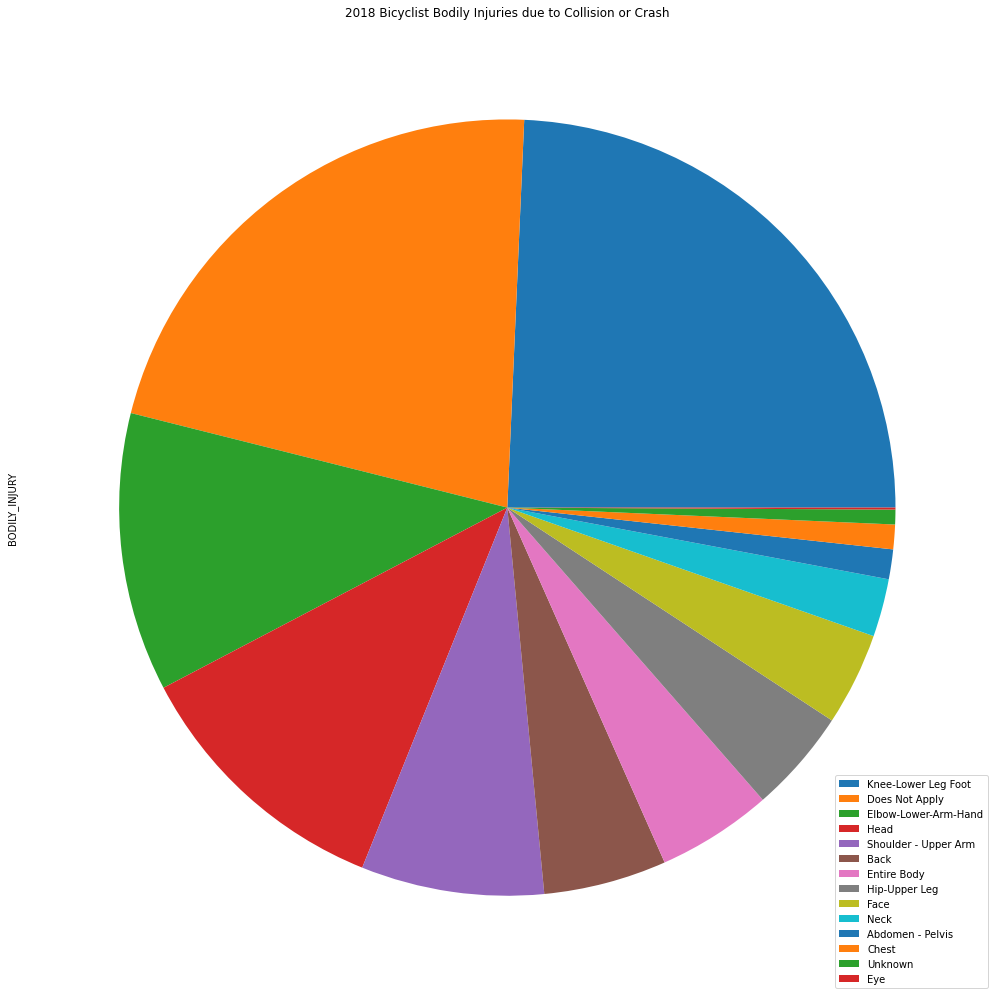

In [221]:
#
vzb2018i['BODILY_INJURY'].value_counts().plot.pie(figsize=(14,14),legend=True,labeldistance=None,title='2018 Bicyclist Bodily Injuries due to Collision or Crash')

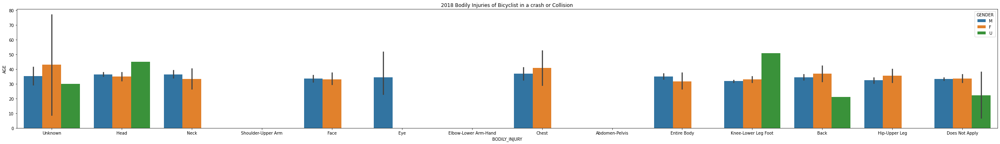

In [222]:
#
plt.figure(figsize=(34,5))
sns.barplot(data=vzb2018i,x='BODILY_INJURY',y='AGE',hue='GENDER',order=['Unknown','Head','Neck','Shoulder-Upper Arm','Face','Eye','Elbow-Lower Arm-Hand','Chest','Abdomen-Pelvis','Entire Body','Knee-Lower Leg Foot','Back','Hip-Upper Leg','Does Not Apply'])
plt.title("2018 Bodily Injuries of Bicyclist in a crash or Collision")
plt.show()

In [224]:
#
print('Emotional Status: \n',vzb2018i['EMOTIONAL_STATUS'].value_counts())

Emotional Status: 
 Conscious         4462
Does Not Apply    1321
Shock               90
Unknown             63
Semiconscious       57
Unconscious         31
Incoherent          23
Apparent Death       5
Name: EMOTIONAL_STATUS, dtype: int64


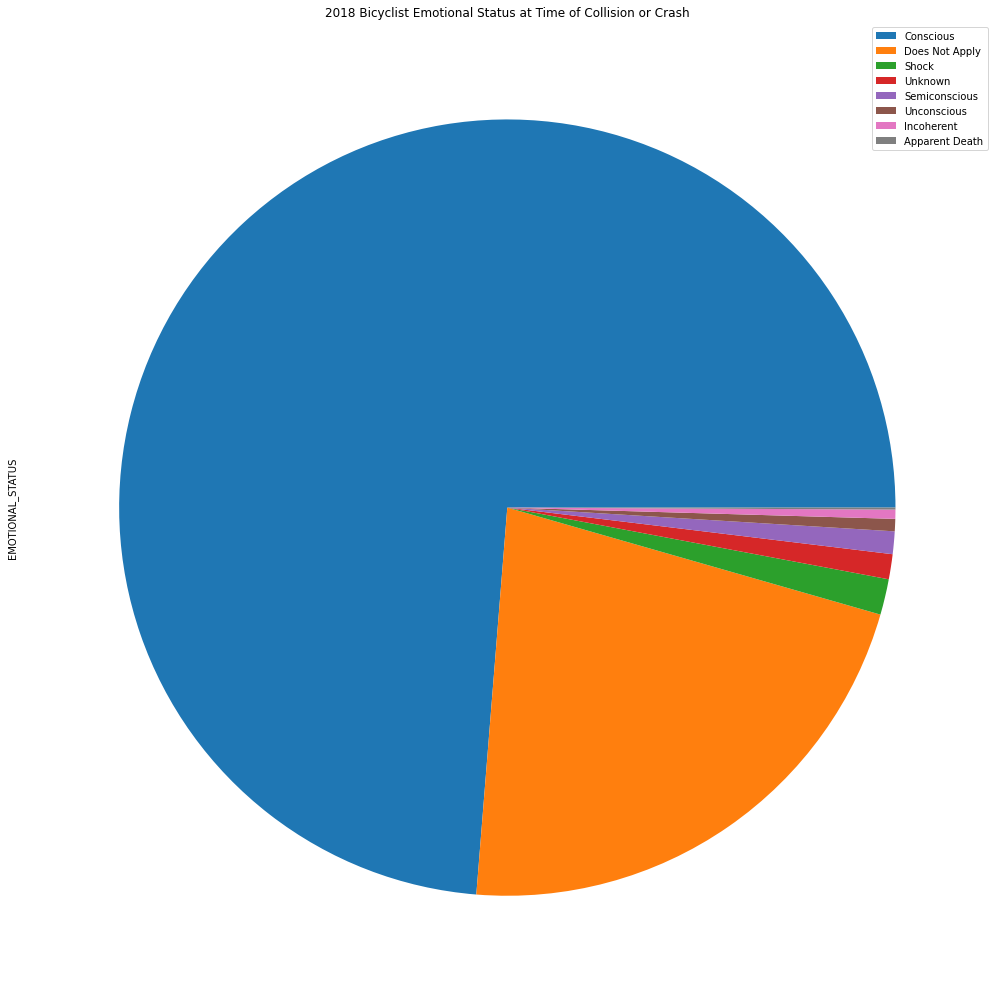

In [223]:
#
vzb2018i['EMOTIONAL_STATUS'].value_counts().plot.pie(figsize=(14,14),legend=True,labeldistance=None,title='2018 Bicyclist Emotional Status at Time of Collision or Crash')

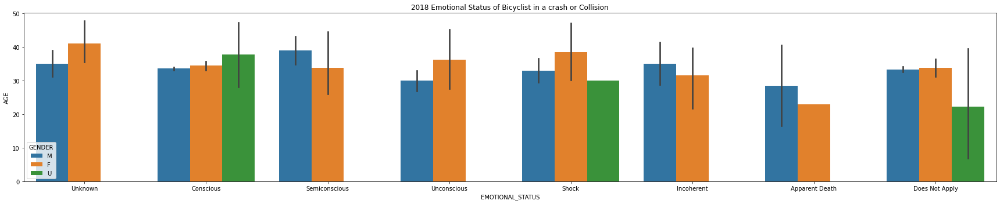

In [225]:
#
plt.figure(figsize=(24,5))
sns.barplot(data=vzb2018i,x='EMOTIONAL_STATUS',y='AGE',hue='GENDER',order=['Unknown','Conscious','Semiconscious','Unconscious','Shock','Incoherent','Apparent Death','Does Not Apply'])
plt.title("2018 Emotional Status of Bicyclist in a crash or Collision")
plt.show()
#Unknown seem to be soley concious

In [226]:
#
#sns.pairplot(data=vzb2018i,hue='EMOTIONAL_STATUS',palette='Spectral_r') 

In [227]:
#
print('Person Injury: \n',vzb2018i['PERSON_INJURY'].value_counts())

Person Injury: 
 Injured        4724
Unspecified    1318
Killed           10
Name: PERSON_INJURY, dtype: int64


In [228]:
#
vzb2018i['PERSON_INJURY'].value_counts().sum()

6052

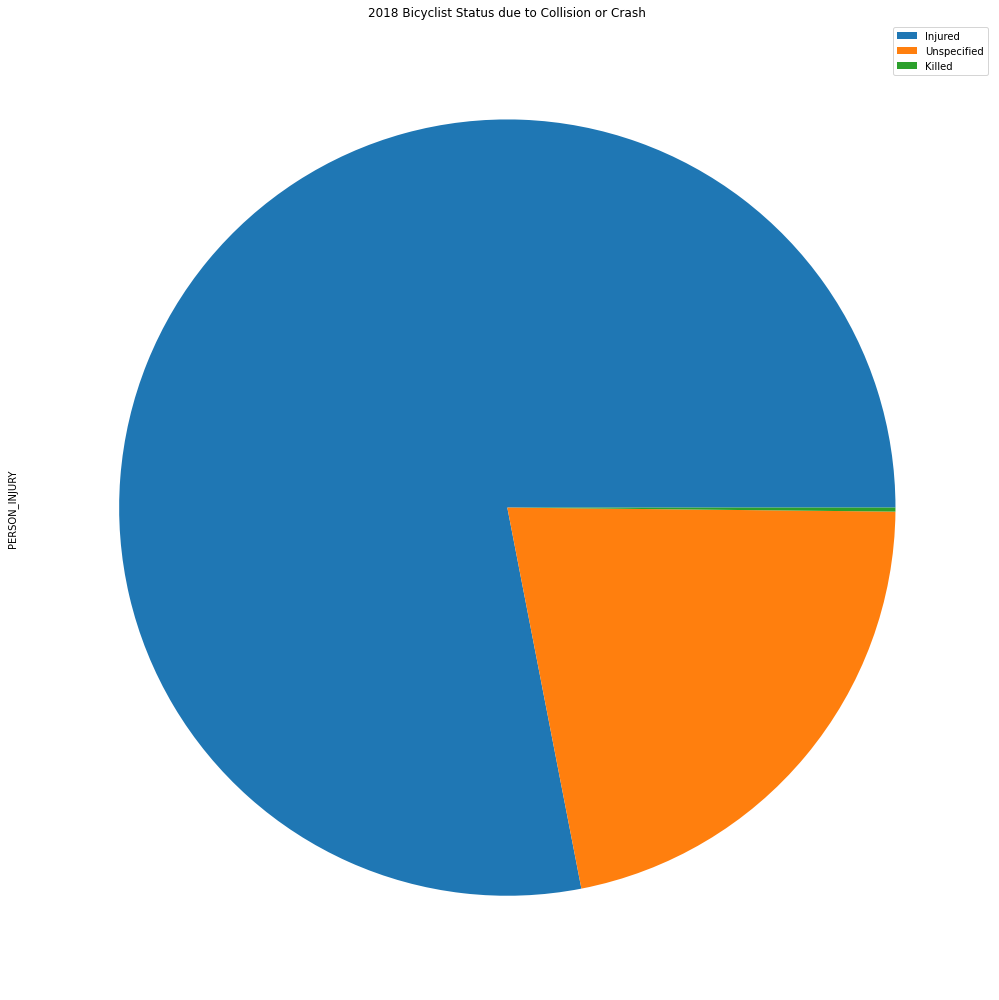

In [229]:
#
vzb2018i['PERSON_INJURY'].value_counts().plot.pie(figsize=(14,14),legend=True,labeldistance=None,title='2018 Bicyclist Status due to Collision or Crash')

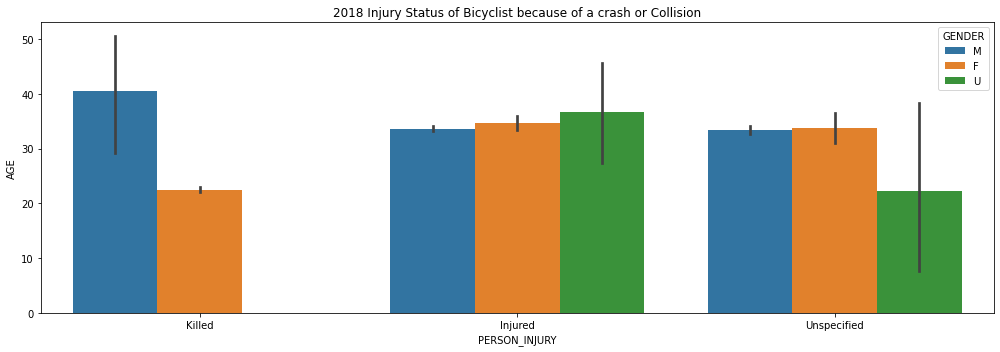

In [230]:
#
plt.figure(figsize=(14,5))
sns.barplot(data=vzb2018i,x='PERSON_INJURY',y='AGE',hue='GENDER',order=['Killed','Injured','Unspecified'])
plt.title("2018 Injury Status of Bicyclist because of a crash or Collision")
plt.show()
#U

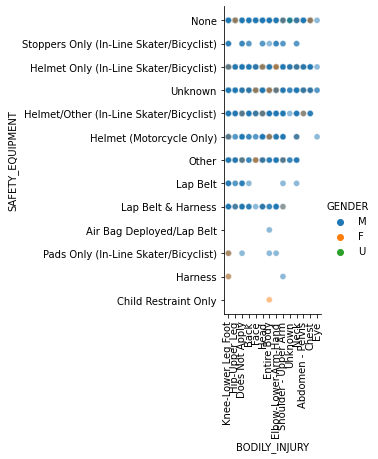

In [231]:
#
sns.relplot(kind='scatter',x='BODILY_INJURY',y='SAFETY_EQUIPMENT',hue='GENDER',alpha=.5,data=vzb2018i) 
plt.xticks(rotation=90)
plt.show()

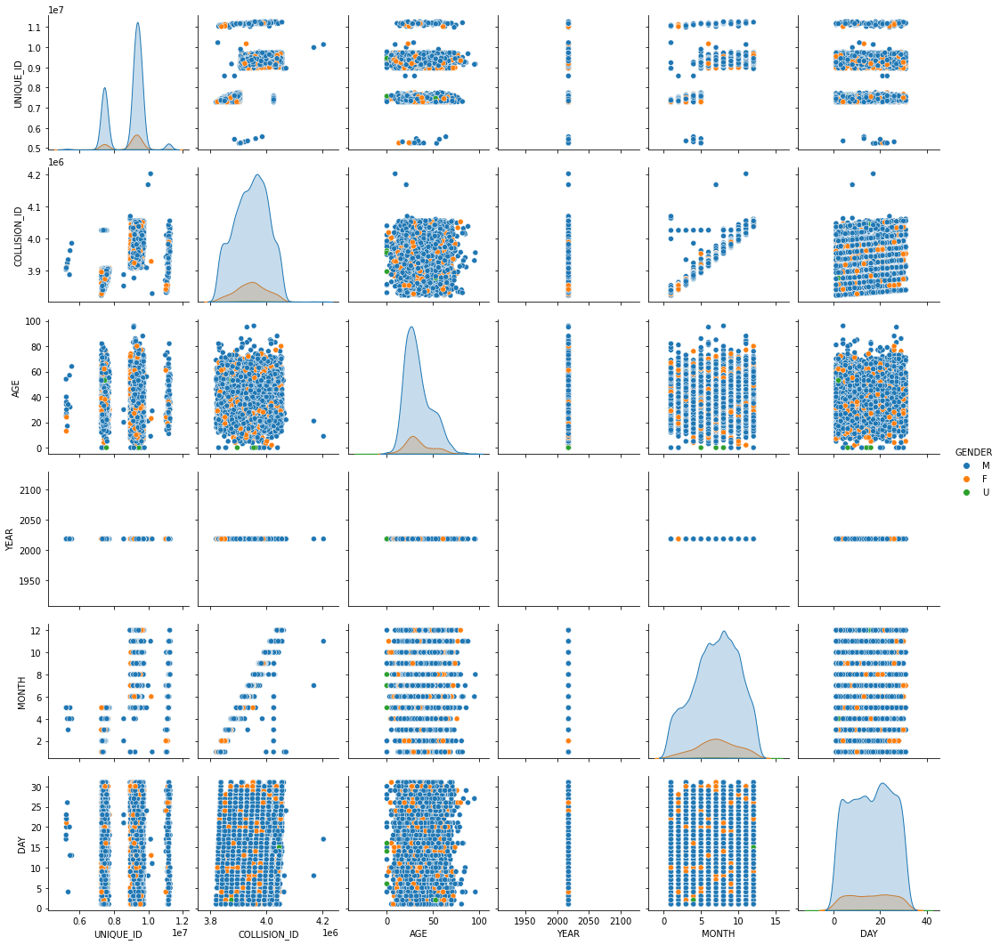

In [232]:
#
sns.pairplot(data=vzb2018i,hue='GENDER') 

In [233]:
#
vzb2018i.groupby(['GENDER','PERSON_INJURY'])['AGE'].mean().sort_values(ascending=True)

GENDER  PERSON_INJURY
U       Unspecified      22.285714
F       Killed           22.500000
M       Unspecified      33.378698
        Injured          33.603286
F       Unspecified      33.750000
        Injured          34.709343
U       Injured          36.714286
M       Killed           40.500000
Name: AGE, dtype: float64

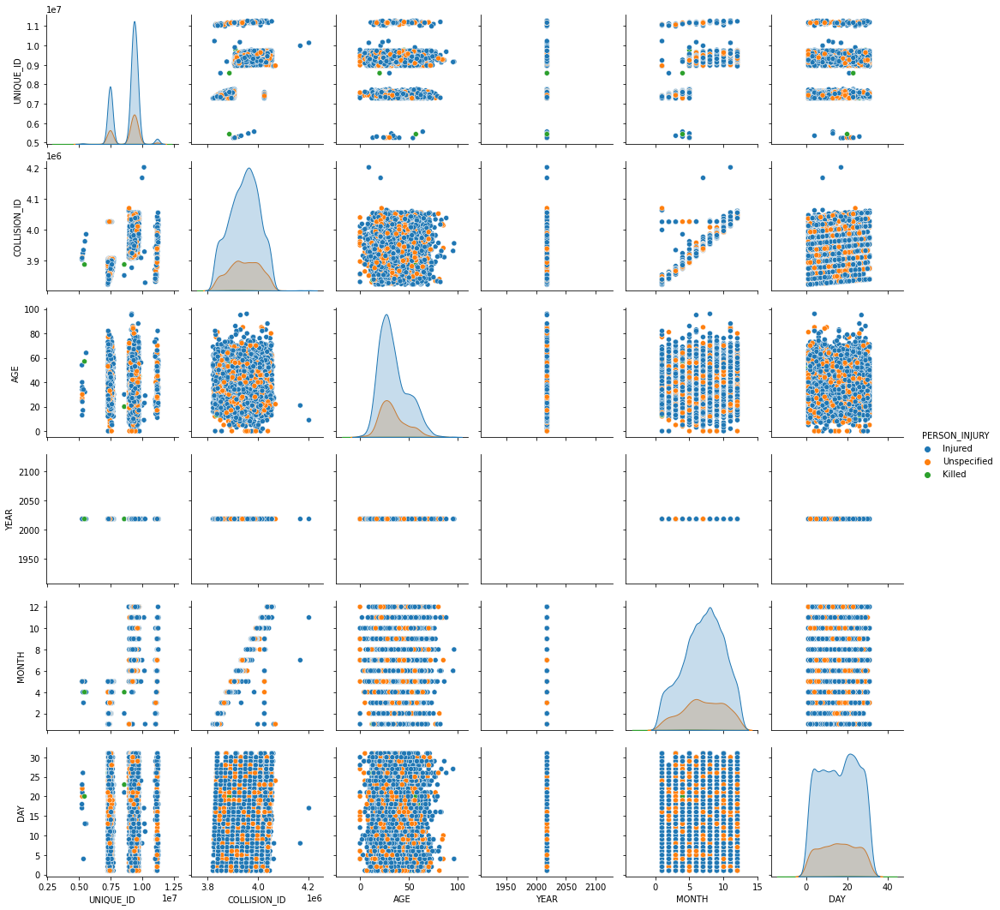

In [234]:
#
sns.pairplot(data=vzb2018i,hue='PERSON_INJURY',height=2.5) 

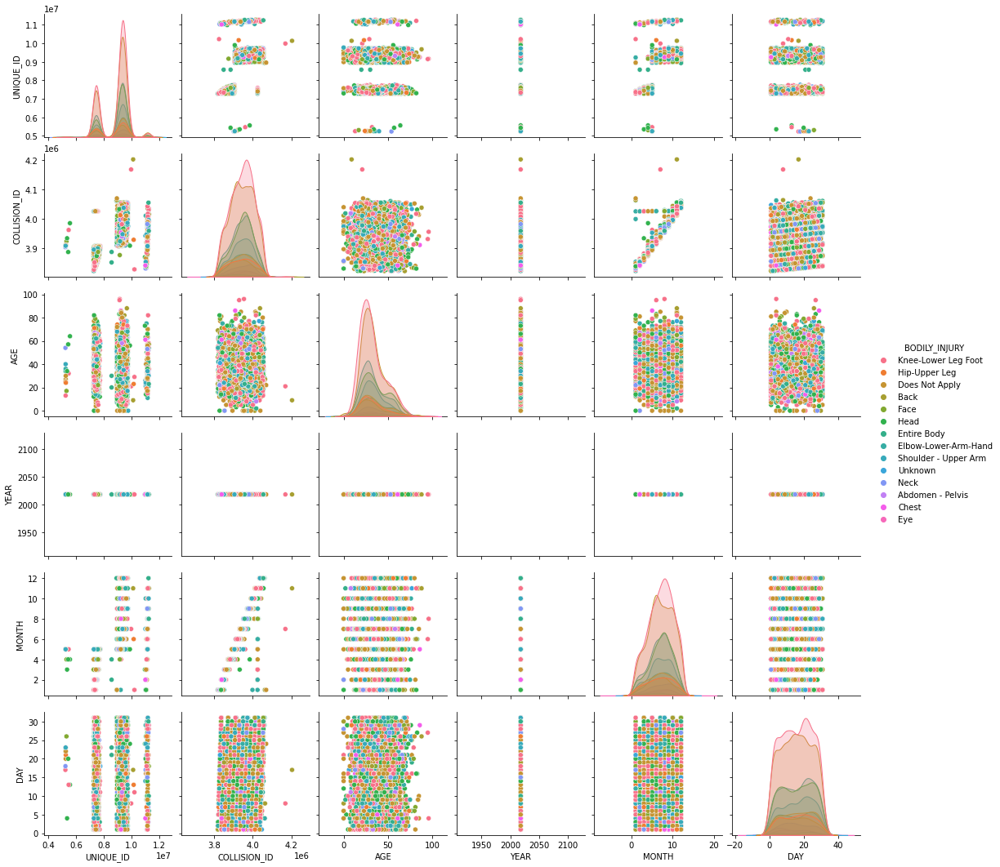

In [235]:
#
sns.pairplot(data=vzb2018i,hue='BODILY_INJURY') 

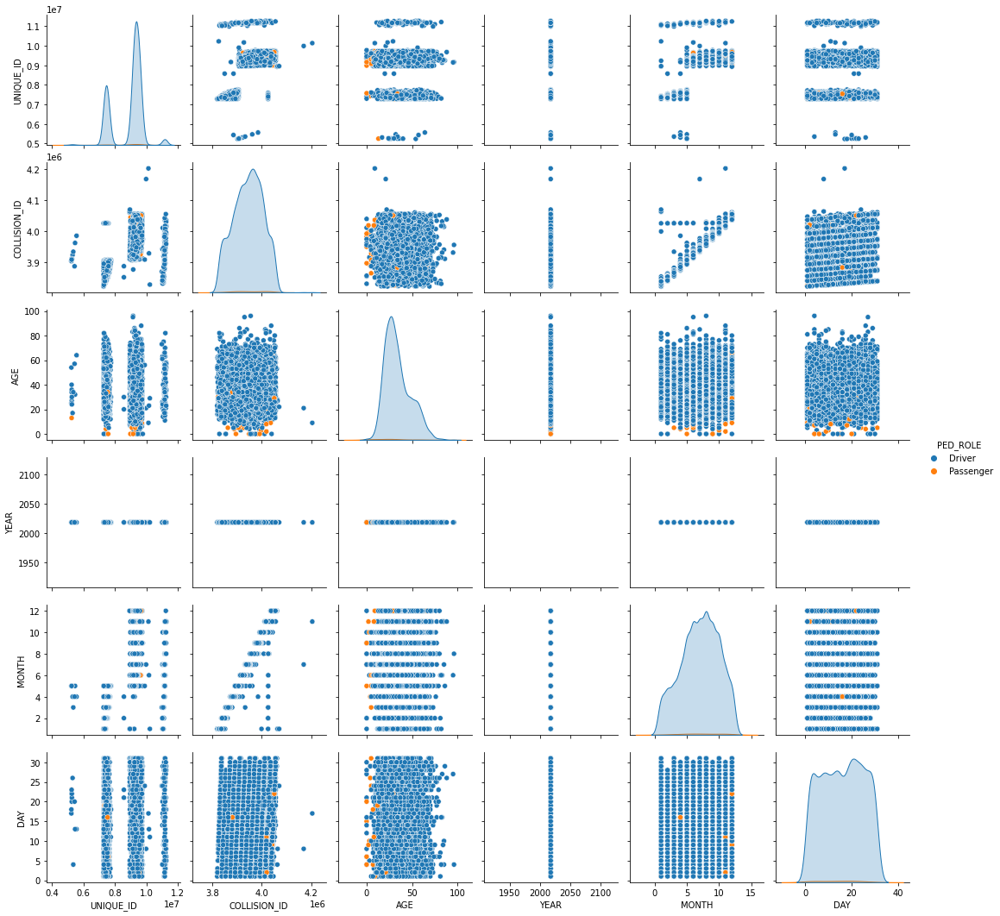

In [236]:
#
sns.pairplot(data=vzb2018i,hue='PED_ROLE') 

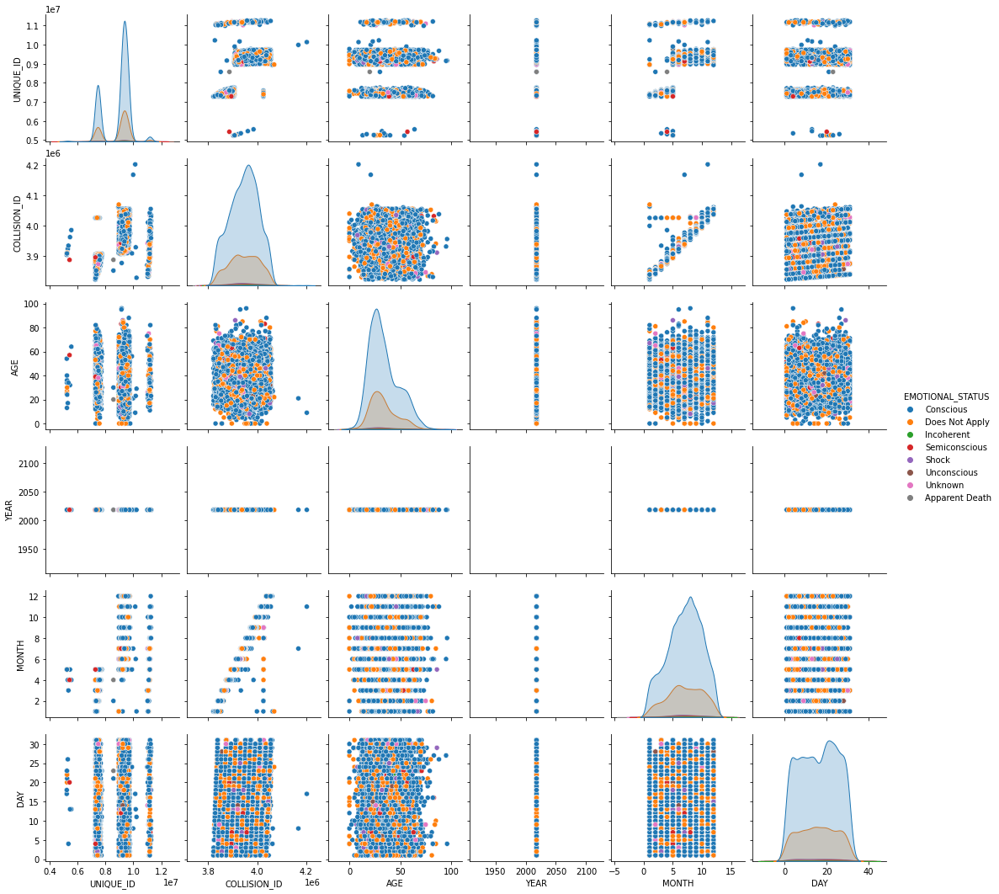

In [237]:
#
sns.pairplot(data=vzb2018i,hue='EMOTIONAL_STATUS') 